# **Практическая работа №8. Генеративно-состязательная сеть (GAN)**

---
**❗ Примечание:**

Не забывайте периодически сохранять параметры модели. Функции для этого описаны в теоретической части. В случае приостановки процесса обучения из-за перегрузки ОЗУ, Вы сможете загрузить последние предобученные параметры и продолжить обучение.

---

In [ ]:
import os

# Использование legacy Keras для совместимости с TensorFlow
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import (
    Input, Dense, Reshape, Flatten,
    BatchNormalization, LeakyReLU,
    Conv2D, Conv2DTranspose,
    Dropout, Embedding, Concatenate, Activation
)
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.initializers import RandomNormal

import numpy as np
from numpy import zeros, ones
from numpy.random import randn, randint
import matplotlib.pyplot as plt

# Проверка GPU
print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
# Подключение Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Путь к папке для сохранения моделей
SAVE_PATH = '/content/drive/MyDrive/GAN_практика_8/'

# Создаём папку, если её нет
os.makedirs(SAVE_PATH, exist_ok=True)

print(f"Папка для сохранения моделей: {SAVE_PATH}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Папка для сохранения моделей: /content/drive/MyDrive/GAN_практика_8/


## **Задание №1.** Обучите генератор воспризводить примитивные изображения. Датасет выберите по желанию. ([Пример №1](https://www.kaggle.com/datasets/andrewmvd/medical-mnist), [Пример №2](https://www.tensorflow.org/api_docs/python/tf/keras/datasets/fashion_mnist/load_data#example), [Пример №3](https://www.kaggle.com/datasets/sagyamthapa/handwritten-math-symbols))





In [ ]:
# Ваш код
# Параметры изображений Fashion MNIST
IMG_SHAPE = (28, 28, 1)   # Чёрно-белые изображения 28x28
LATENT_DIM = 100          # Размерность вектора шума

print(f"Форма изображения: {IMG_SHAPE}")
print(f"Размерность латентного пространства: {LATENT_DIM}")

Форма изображения: (28, 28, 1)
Размерность латентного пространства: 100


In [ ]:
def load_fashion_mnist():
    """Загружает и нормализует Fashion MNIST."""
    (X_train, _), (_, _) = tf.keras.datasets.fashion_mnist.load_data()

    # Нормализация: [0, 255] -> [-1, 1]
    X_train = X_train / 127.5 - 1.
    X_train = np.expand_dims(X_train, axis=-1)  # (60000, 28, 28, 1)

    print(f"Форма датасета: {X_train.shape}")
    print(f"Диапазон значений: [{X_train.min():.2f}, {X_train.max():.2f}]")
    return X_train

X_train = load_fashion_mnist()

Форма датасета: (60000, 28, 28, 1)
Диапазон значений: [-1.00, 1.00]


In [ ]:
def build_generator(latent_dim=100, img_shape=(28, 28, 1)):
    """Генератор: шум -> изображение."""
    model = Sequential(name="Generator")

    model.add(Dense(256, input_shape=(latent_dim,)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))

    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))

    model.add(Dense(1024))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))

    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))

    noise = Input(shape=(latent_dim,))
    img = model(noise)
    return Model(noise, img, name="Generator_Model")

generator = build_generator(LATENT_DIM, IMG_SHAPE)
generator.summary()

Model: "Generator_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 Generator (Sequential)      (None, 28, 28, 1)         1493520   
                                                                 
Total params: 1493520 (5.70 MB)
Trainable params: 1489936 (5.68 MB)
Non-trainable params: 3584 (14.00 KB)
_________________________________________________________________


In [ ]:
def build_discriminator(img_shape=(28, 28, 1)):
    """Дискриминатор: изображение -> реальное/поддельное."""
    model = Sequential(name="Discriminator")

    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))

    img = Input(shape=img_shape)
    validity = model(img)
    return Model(img, validity, name="Discriminator_Model")

optimizer = Adam(learning_rate=0.0002, beta_1=0.5)

discriminator = build_discriminator(IMG_SHAPE)
discriminator.compile(loss='binary_crossentropy',
                      optimizer=optimizer,
                      metrics=['accuracy'])
discriminator.summary()

Model: "Discriminator_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 Discriminator (Sequential)  (None, 1)                 533505    
                                                                 
Total params: 533505 (2.04 MB)
Trainable params: 533505 (2.04 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
def build_combined_model(generator, discriminator, latent_dim=100):
    """Объединяет генератор и дискриминатор для обучения генератора."""
    discriminator.trainable = False

    z = Input(shape=(latent_dim,))
    generated_img = generator(z)
    validity = discriminator(generated_img)

    combined = Model(z, validity, name="Combined_GAN")
    combined.compile(loss='binary_crossentropy',
                     optimizer=Adam(learning_rate=0.0002, beta_1=0.5))
    combined.summary()
    return combined

combined = build_combined_model(generator, discriminator, LATENT_DIM)

Model: "Combined_GAN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 100)]             0         
                                                                 
 Generator_Model (Functiona  (None, 28, 28, 1)         1493520   
 l)                                                              
                                                                 
 Discriminator_Model (Funct  (None, 1)                 533505    
 ional)                                                          
                                                                 
Total params: 2027025 (7.73 MB)
Trainable params: 1489936 (5.68 MB)
Non-trainable params: 537089 (2.05 MB)
_________________________________________________________________


In [ ]:
def generate_noise(batch_size, latent_dim=100):
    return np.random.normal(0, 1, (batch_size, latent_dim))

def generate_real_samples(X_train, batch_size):
    idx = np.random.randint(0, X_train.shape[0], batch_size)
    return X_train[idx], np.ones((batch_size, 1))

def generate_fake_samples(generator, batch_size, latent_dim=100):
    noise = generate_noise(batch_size, latent_dim)
    images = generator.predict(noise, verbose=0)
    return images, np.zeros((batch_size, 1))

def save_generated_images(generator, epoch, latent_dim=100,
                          examples=25, save_path=''):
    noise = generate_noise(examples, latent_dim)
    imgs = generator.predict(noise, verbose=0)
    imgs = 0.5 * imgs + 0.5  # Денормализация [-1,1] -> [0,1]

    fig, axs = plt.subplots(5, 5, figsize=(10, 10))
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.suptitle(f'Fashion MNIST GAN — Эпоха {epoch}', fontsize=14)
    plt.tight_layout()
    filepath = f"{save_path}fashion_gan_epoch_{epoch:05d}.png"
    plt.savefig(filepath, dpi=100)
    plt.close()
    print(f"  Сохранено: {filepath}")

In [ ]:
def train_gan(generator, discriminator, combined, X_train,
              epochs=10000, batch_size=128, save_interval=1000,
              latent_dim=100, save_path=''):

    half_batch = batch_size // 2
    d_losses, g_losses = [], []

    for epoch in range(epochs):

        # 1 Обучение дискриминатора
        real_imgs, real_labels = generate_real_samples(X_train, half_batch)
        fake_imgs, fake_labels = generate_fake_samples(generator, half_batch, latent_dim)

        d_loss_real = discriminator.train_on_batch(real_imgs, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Шаг 2 Обучение генератора
        noise = generate_noise(batch_size, latent_dim)
        valid = np.ones((batch_size, 1))
        g_loss = combined.train_on_batch(noise, valid)

        d_losses.append(d_loss[0])
        g_losses.append(g_loss)

        if epoch % 100 == 0:
            print(f"Эпоха {epoch:5d} | "
                  f"D loss: {d_loss[0]:.4f}, acc: {100*d_loss[1]:.1f}% | "
                  f"G loss: {g_loss:.4f}")

        if epoch % save_interval == 0:
            save_generated_images(generator, epoch, latent_dim,
                                  save_path=save_path)
            # Сохраняем веса на Google Drive
            discriminator.trainable = True
            generator.save(f"{save_path}task1_generator.h5")
            discriminator.save(f"{save_path}task1_discriminator.h5")
            discriminator.trainable = False
            combined.save(f"{save_path}task1_combined.h5")

    return d_losses, g_losses

In [ ]:
EPOCHS = 10000
BATCH_SIZE = 128
SAVE_INTERVAL = 1000

# SAVE_PATH — из первого блока подключения Google Drive
d_losses, g_losses = train_gan(
    generator=generator,
    discriminator=discriminator,
    combined=combined,
    X_train=X_train,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    save_interval=SAVE_INTERVAL,
    latent_dim=LATENT_DIM,
    save_path=SAVE_PATH
)

Эпоха     0 | D loss: 0.6224, acc: 55.5% | G loss: 0.6429


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_00000.png
Эпоха   100 | D loss: 0.0267, acc: 100.0% | G loss: 4.3273
Эпоха   200 | D loss: 0.3605, acc: 82.0% | G loss: 2.8392
Эпоха   300 | D loss: 0.4893, acc: 74.2% | G loss: 2.0329
Эпоха   400 | D loss: 0.7128, acc: 61.7% | G loss: 0.9768
Эпоха   500 | D loss: 0.6182, acc: 68.0% | G loss: 0.8288
Эпоха   600 | D loss: 0.6213, acc: 64.8% | G loss: 0.9128
Эпоха   700 | D loss: 0.6411, acc: 61.7% | G loss: 1.0035
Эпоха   800 | D loss: 0.5918, acc: 70.3% | G loss: 0.9170
Эпоха   900 | D loss: 0.6427, acc: 64.1% | G loss: 0.9088
Эпоха  1000 | D loss: 0.6186, acc: 66.4% | G loss: 0.8650


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_01000.png
Эпоха  1100 | D loss: 0.5564, acc: 78.9% | G loss: 0.9822
Эпоха  1200 | D loss: 0.5276, acc: 80.5% | G loss: 1.0714
Эпоха  1300 | D loss: 0.6089, acc: 64.1% | G loss: 0.9840
Эпоха  1400 | D loss: 0.5768, acc: 71.1% | G loss: 0.9531
Эпоха  1500 | D loss: 0.5842, acc: 68.8% | G loss: 0.9617
Эпоха  1600 | D loss: 0.6386, acc: 66.4% | G loss: 0.8874
Эпоха  1700 | D loss: 0.6706, acc: 60.9% | G loss: 0.9099
Эпоха  1800 | D loss: 0.6067, acc: 64.8% | G loss: 0.9411
Эпоха  1900 | D loss: 0.6003, acc: 64.8% | G loss: 0.8696
Эпоха  2000 | D loss: 0.6825, acc: 58.6% | G loss: 0.9119


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_02000.png
Эпоха  2100 | D loss: 0.6497, acc: 63.3% | G loss: 0.8503
Эпоха  2200 | D loss: 0.6502, acc: 64.8% | G loss: 0.9136
Эпоха  2300 | D loss: 0.6488, acc: 55.5% | G loss: 0.8707
Эпоха  2400 | D loss: 0.6127, acc: 61.7% | G loss: 0.8609
Эпоха  2500 | D loss: 0.6216, acc: 62.5% | G loss: 0.8088
Эпоха  2600 | D loss: 0.6540, acc: 57.0% | G loss: 0.8396
Эпоха  2700 | D loss: 0.6667, acc: 57.0% | G loss: 0.9243
Эпоха  2800 | D loss: 0.6459, acc: 68.0% | G loss: 0.8573
Эпоха  2900 | D loss: 0.6702, acc: 55.5% | G loss: 0.8892
Эпоха  3000 | D loss: 0.6379, acc: 62.5% | G loss: 0.8551


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_03000.png
Эпоха  3100 | D loss: 0.6634, acc: 59.4% | G loss: 0.8071
Эпоха  3200 | D loss: 0.6687, acc: 58.6% | G loss: 0.8524
Эпоха  3300 | D loss: 0.6812, acc: 54.7% | G loss: 0.8411
Эпоха  3400 | D loss: 0.7004, acc: 53.1% | G loss: 0.8555
Эпоха  3500 | D loss: 0.6276, acc: 67.2% | G loss: 0.8588
Эпоха  3600 | D loss: 0.6119, acc: 69.5% | G loss: 0.8271
Эпоха  3700 | D loss: 0.6393, acc: 67.2% | G loss: 0.8545
Эпоха  3800 | D loss: 0.6465, acc: 59.4% | G loss: 0.8669
Эпоха  3900 | D loss: 0.6691, acc: 57.8% | G loss: 0.8507
Эпоха  4000 | D loss: 0.6716, acc: 56.2% | G loss: 0.8198


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_04000.png
Эпоха  4100 | D loss: 0.6613, acc: 64.1% | G loss: 0.8574
Эпоха  4200 | D loss: 0.6967, acc: 56.2% | G loss: 0.8569
Эпоха  4300 | D loss: 0.6656, acc: 63.3% | G loss: 0.8673
Эпоха  4400 | D loss: 0.6637, acc: 60.2% | G loss: 0.8598
Эпоха  4500 | D loss: 0.6749, acc: 53.1% | G loss: 0.8574
Эпоха  4600 | D loss: 0.6892, acc: 56.2% | G loss: 0.8285
Эпоха  4700 | D loss: 0.7025, acc: 53.1% | G loss: 0.8557
Эпоха  4800 | D loss: 0.6888, acc: 51.6% | G loss: 0.8340
Эпоха  4900 | D loss: 0.6848, acc: 60.9% | G loss: 0.8165
Эпоха  5000 | D loss: 0.7065, acc: 48.4% | G loss: 0.8364


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_05000.png
Эпоха  5100 | D loss: 0.6773, acc: 60.2% | G loss: 0.7955
Эпоха  5200 | D loss: 0.6803, acc: 56.2% | G loss: 0.8087
Эпоха  5300 | D loss: 0.7017, acc: 51.6% | G loss: 0.8426
Эпоха  5400 | D loss: 0.6497, acc: 65.6% | G loss: 0.8299
Эпоха  5500 | D loss: 0.6613, acc: 59.4% | G loss: 0.8283
Эпоха  5600 | D loss: 0.7049, acc: 47.7% | G loss: 0.7985
Эпоха  5700 | D loss: 0.6703, acc: 56.2% | G loss: 0.7855
Эпоха  5800 | D loss: 0.6679, acc: 59.4% | G loss: 0.7952
Эпоха  5900 | D loss: 0.7300, acc: 47.7% | G loss: 0.7871
Эпоха  6000 | D loss: 0.6751, acc: 55.5% | G loss: 0.7866


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_06000.png
Эпоха  6100 | D loss: 0.7109, acc: 46.9% | G loss: 0.8106
Эпоха  6200 | D loss: 0.6824, acc: 59.4% | G loss: 0.7906
Эпоха  6300 | D loss: 0.6951, acc: 56.2% | G loss: 0.8396
Эпоха  6400 | D loss: 0.6752, acc: 50.8% | G loss: 0.7746
Эпоха  6500 | D loss: 0.6999, acc: 55.5% | G loss: 0.7946
Эпоха  6600 | D loss: 0.6607, acc: 58.6% | G loss: 0.8103
Эпоха  6700 | D loss: 0.6835, acc: 58.6% | G loss: 0.7885
Эпоха  6800 | D loss: 0.6926, acc: 51.6% | G loss: 0.8224
Эпоха  6900 | D loss: 0.6847, acc: 53.9% | G loss: 0.7821
Эпоха  7000 | D loss: 0.6807, acc: 51.6% | G loss: 0.7483


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_07000.png
Эпоха  7100 | D loss: 0.6996, acc: 53.1% | G loss: 0.7865
Эпоха  7200 | D loss: 0.6761, acc: 58.6% | G loss: 0.8139
Эпоха  7300 | D loss: 0.6852, acc: 56.2% | G loss: 0.7799
Эпоха  7400 | D loss: 0.7209, acc: 50.0% | G loss: 0.8123
Эпоха  7500 | D loss: 0.7118, acc: 47.7% | G loss: 0.8066
Эпоха  7600 | D loss: 0.6689, acc: 60.9% | G loss: 0.7920
Эпоха  7700 | D loss: 0.7032, acc: 54.7% | G loss: 0.8075
Эпоха  7800 | D loss: 0.7288, acc: 47.7% | G loss: 0.7931
Эпоха  7900 | D loss: 0.6651, acc: 59.4% | G loss: 0.7745
Эпоха  8000 | D loss: 0.6826, acc: 55.5% | G loss: 0.7590


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_08000.png
Эпоха  8100 | D loss: 0.6926, acc: 57.0% | G loss: 0.8053
Эпоха  8200 | D loss: 0.6880, acc: 53.1% | G loss: 0.7837
Эпоха  8300 | D loss: 0.6925, acc: 53.9% | G loss: 0.7939
Эпоха  8400 | D loss: 0.6819, acc: 53.9% | G loss: 0.7663
Эпоха  8500 | D loss: 0.6895, acc: 57.8% | G loss: 0.8084
Эпоха  8600 | D loss: 0.7178, acc: 46.9% | G loss: 0.7849
Эпоха  8700 | D loss: 0.6852, acc: 52.3% | G loss: 0.7999
Эпоха  8800 | D loss: 0.6726, acc: 64.1% | G loss: 0.8118
Эпоха  8900 | D loss: 0.7010, acc: 53.1% | G loss: 0.8420
Эпоха  9000 | D loss: 0.7005, acc: 55.5% | G loss: 0.7866


  Сохранено: /content/drive/MyDrive/GAN_практика_8/fashion_gan_epoch_09000.png
Эпоха  9100 | D loss: 0.7174, acc: 53.1% | G loss: 0.7787
Эпоха  9200 | D loss: 0.6923, acc: 46.1% | G loss: 0.8191
Эпоха  9300 | D loss: 0.6741, acc: 54.7% | G loss: 0.7792
Эпоха  9400 | D loss: 0.6856, acc: 58.6% | G loss: 0.7879
Эпоха  9500 | D loss: 0.7023, acc: 53.9% | G loss: 0.7824
Эпоха  9600 | D loss: 0.7200, acc: 42.2% | G loss: 0.8012
Эпоха  9700 | D loss: 0.6957, acc: 53.1% | G loss: 0.8010
Эпоха  9800 | D loss: 0.6740, acc: 54.7% | G loss: 0.7632
Эпоха  9900 | D loss: 0.6816, acc: 54.7% | G loss: 0.8029


### **Демонстрация сгенерированных изображений:**

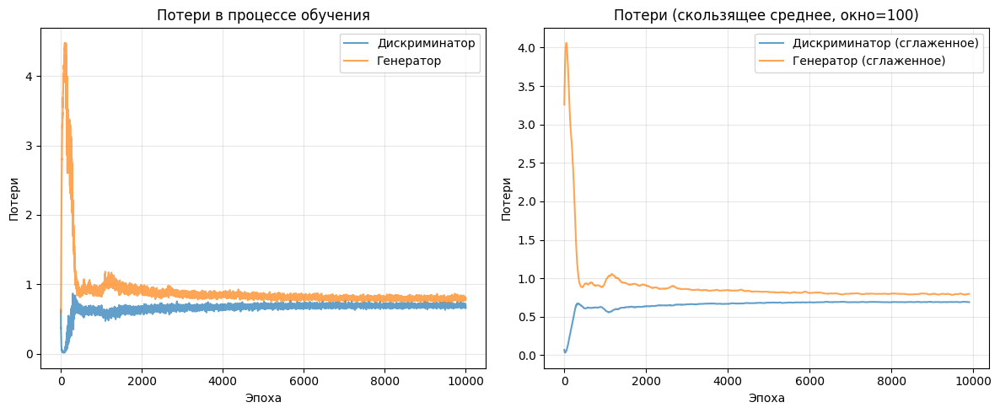

In [ ]:
def plot_training_history(d_losses, g_losses):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(d_losses, label='Дискриминатор', alpha=0.7)
    plt.plot(g_losses, label='Генератор', alpha=0.7)
    plt.xlabel('Эпоха')
    plt.ylabel('Потери')
    plt.title('Потери в процессе обучения')
    plt.legend()
    plt.grid(True, alpha=0.3)

    window = 100
    plt.subplot(1, 2, 2)
    if len(d_losses) > window:
        d_smooth = np.convolve(d_losses, np.ones(window)/window, mode='valid')
        g_smooth = np.convolve(g_losses, np.ones(window)/window, mode='valid')
        plt.plot(d_smooth, label='Дискриминатор (сглаженное)', alpha=0.7)
        plt.plot(g_smooth, label='Генератор (сглаженное)', alpha=0.7)
    plt.xlabel('Эпоха')
    plt.ylabel('Потери')
    plt.title(f'Потери (скользящее среднее, окно={window})')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f"{SAVE_PATH}task1_training_history.png", dpi=150)
    plt.show()

plot_training_history(d_losses, g_losses)

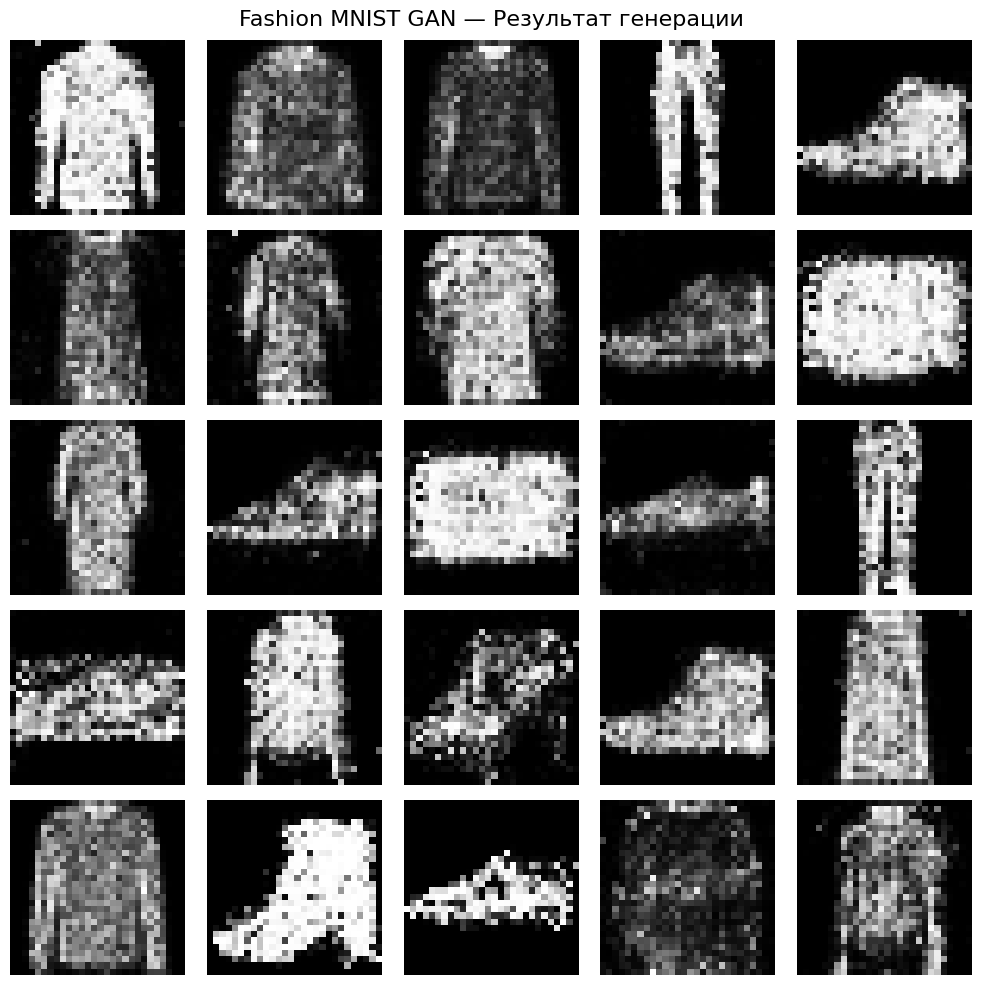

In [ ]:
# Ваш код
def demonstrate_results(generator, n_images=25, latent_dim=100):
    noise = generate_noise(n_images, latent_dim)
    imgs = generator.predict(noise, verbose=0)
    imgs = 0.5 * imgs + 0.5  # Денормализация [-1,1] -> [0,1]

    grid = int(np.sqrt(n_images))
    fig, axes = plt.subplots(grid, grid, figsize=(10, 10))

    for i, ax in enumerate(axes.flatten()):
        ax.imshow(imgs[i, :, :, 0], cmap='gray')
        ax.axis('off')

    plt.suptitle('Fashion MNIST GAN — Результат генерации', fontsize=16)
    plt.tight_layout()
    plt.savefig(f"{SAVE_PATH}task1_final_results.png", dpi=150)
    plt.show()

demonstrate_results(generator, n_images=25, latent_dim=LATENT_DIM)

---

## **Задание №2.** Обучите генератор воспризводить примитивные изображения по заданному условию (Conditional Generative Adversarial Nets (CGAN)).



(На вход генератора подается вектор случайного шума и метка класса - на выходе должно получиться изображение, соответствующее данному классу)



Датасет выберите по желанию. ([Пример №1](https://www.kaggle.com/datasets/andrewmvd/medical-mnist), [Пример №2](https://www.tensorflow.org/api_docs/python/tf/keras/datasets/fashion_mnist/load_data#example), [Пример №3](https://www.kaggle.com/datasets/sagyamthapa/handwritten-math-symbols))

In [ ]:
# Параметры CGAN для Fashion MNIST
IMG_SHAPE = (28, 28, 1)   # Чёрно-белые изображения
LATENT_DIM = 100
N_CLASSES = 10

# Названия классов Fashion MNIST
CLASS_NAMES = ['Футболка', 'Брюки', 'Пуловер', 'Платье', 'Пальто',
               'Сандалии', 'Рубашка', 'Кроссовки', 'Сумка', 'Ботинки']

print(f"Форма изображения: {IMG_SHAPE}")
print(f"Количество классов: {N_CLASSES}")
print(f"Классы: {CLASS_NAMES}")

Форма изображения: (28, 28, 1)
Количество классов: 10
Классы: ['Футболка', 'Брюки', 'Пуловер', 'Платье', 'Пальто', 'Сандалии', 'Рубашка', 'Кроссовки', 'Сумка', 'Ботинки']


In [ ]:
def load_fashion_mnist_cgan():
    """Загружает Fashion MNIST с метками классов."""
    (X_train, y_train), (_, _) = tf.keras.datasets.fashion_mnist.load_data()

    # Нормализация: [0, 255] -> [-1, 1]
    X_train = X_train / 127.5 - 1.
    X_train = np.expand_dims(X_train, axis=-1)  # (60000, 28, 28, 1)
    y_train = y_train.flatten()

    print(f"Форма изображений: {X_train.shape}")
    print(f"Форма меток: {y_train.shape}")
    print(f"Диапазон значений: [{X_train.min():.2f}, {X_train.max():.2f}]")
    return X_train, y_train

X_train, y_train = load_fashion_mnist_cgan()

Форма изображений: (60000, 28, 28, 1)
Форма меток: (60000,)
Диапазон значений: [-1.00, 1.00]


In [ ]:
# Ваш код
def build_cgan_discriminator(img_shape=(28, 28, 1), n_classes=10):
    """
    Дискриминатор принимает изображение + метку класса.
    Метка преобразуется в доп. канал и конкатенируется с изображением.
    """

    # Обработка метки
    in_label = Input(shape=(1,), name="class_label_input")
    label_emb = Embedding(n_classes, 50, name="label_embedding")(in_label)
    n_nodes = img_shape[0] * img_shape[1]   # 28 * 28 = 784
    label_dense = Dense(n_nodes, name="label_dense")(label_emb)
    label_reshaped = Reshape((img_shape[0], img_shape[1], 1),
                             name="label_reshape")(label_dense)

    # Обработка изображения
    in_image = Input(shape=img_shape, name="image_input")

    # Объединение: (28, 28, 1) + (28, 28, 1) = (28, 28, 2)
    merged = Concatenate(name="concat")([in_image, label_reshaped])

    # Свёрточные блоки
    # 28x28 -> 14x14
    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same', name="conv1")(merged)
    x = LeakyReLU(alpha=0.2, name="lrelu1")(x)

    # 14x14 -> 7x7
    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same', name="conv2")(x)
    x = LeakyReLU(alpha=0.2, name="lrelu2")(x)

    x = Flatten(name="flatten")(x)
    x = Dropout(0.4, name="dropout")(x)
    out = Dense(1, activation='sigmoid', name="output")(x)

    model = Model([in_image, in_label], out, name="CGAN_Discriminator")
    model.compile(loss='binary_crossentropy',
                  optimizer=Adam(learning_rate=0.0002, beta_1=0.5),
                  metrics=['accuracy'])
    model.summary()
    return model

discriminator = build_cgan_discriminator(IMG_SHAPE, N_CLASSES)

Model: "CGAN_Discriminator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 class_label_input (InputLa  [(None, 1)]                  0         []                            
 yer)                                                                                             
                                                                                                  
 label_embedding (Embedding  (None, 1, 50)                500       ['class_label_input[0][0]']   
 )                                                                                                
                                                                                                  
 label_dense (Dense)         (None, 1, 784)               39984     ['label_embedding[0][0]']     
                                                                                 

In [ ]:
def build_cgan_generator(latent_dim=100, n_classes=10):
    """
    Генератор принимает вектор шума + метку класса.
    Начинает с 7x7, затем два раза увеличивает до 28x28.
    """

    # Обработка метки
    in_label = Input(shape=(1,), name="class_label_input")
    label_emb = Embedding(n_classes, 50, name="label_embedding")(in_label)
    label_dense = Dense(7 * 7, name="label_dense")(label_emb)
    label_reshaped = Reshape((7, 7, 1), name="label_reshape")(label_dense)

    # Обработка латентного вектора
    in_latent = Input(shape=(latent_dim,), name="latent_input")
    x = Dense(128 * 7 * 7, name="latent_dense")(in_latent)
    x = LeakyReLU(alpha=0.2, name="latent_lrelu")(x)
    x = Reshape((7, 7, 128), name="latent_reshape")(x)

    # Объединение: (7, 7, 128) + (7, 7, 1) = (7, 7, 129)
    merged = Concatenate(name="concat")([x, label_reshaped])

    # Повышающая дискретизация
    # 7x7 -> 14x14
    x = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same',
                        name="deconv1")(merged)
    x = LeakyReLU(alpha=0.2, name="deconv1_lrelu")(x)

    # 14x14 -> 28x28
    x = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same',
                        name="deconv2")(x)
    x = LeakyReLU(alpha=0.2, name="deconv2_lrelu")(x)

    # Выход: 1 канал (grayscale), tanh -> [-1, 1]
    out = Conv2D(1, (7, 7), activation='tanh', padding='same',
                 name="output")(x)

    model = Model([in_latent, in_label], out, name="CGAN_Generator")
    model.summary()
    return model

generator = build_cgan_generator(LATENT_DIM, N_CLASSES)

Model: "CGAN_Generator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 latent_input (InputLayer)   [(None, 100)]                0         []                            
                                                                                                  
 class_label_input (InputLa  [(None, 1)]                  0         []                            
 yer)                                                                                             
                                                                                                  
 latent_dense (Dense)        (None, 6272)                 633472    ['latent_input[0][0]']        
                                                                                                  
 label_embedding (Embedding  (None, 1, 50)                500       ['class_label_inp

In [ ]:
def build_cgan_combined(generator, discriminator, latent_dim=100):
    discriminator.trainable = False

    in_latent = Input(shape=(latent_dim,), name="latent_input")
    in_label = Input(shape=(1,), name="label_input")

    gen_image = generator([in_latent, in_label])
    validity = discriminator([gen_image, in_label])

    model = Model([in_latent, in_label], validity, name="CGAN_Combined")
    model.compile(loss='binary_crossentropy',
                  optimizer=Adam(learning_rate=0.0002, beta_1=0.5))
    model.summary()
    return model

combined = build_cgan_combined(generator, discriminator, LATENT_DIM)

Model: "CGAN_Combined"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 latent_input (InputLayer)   [(None, 100)]                0         []                            
                                                                                                  
 label_input (InputLayer)    [(None, 1)]                  0         []                            
                                                                                                  
 CGAN_Generator (Functional  (None, 28, 28, 1)            1169336   ['latent_input[0][0]',        
 )                                                                   'label_input[0][0]']         
                                                                                                  
 CGAN_Discriminator (Functi  (None, 1)                    196773    ['CGAN_Generator[0

In [ ]:
def generate_latent_points(latent_dim, n_samples, n_classes=10):
    latent_vectors = np.random.randn(n_samples, latent_dim)
    labels = np.random.randint(0, n_classes, n_samples)
    return latent_vectors, labels

def generate_real_samples_cgan(X_train, y_train, n_samples):
    idx = np.random.randint(0, X_train.shape[0], n_samples)
    return [X_train[idx], y_train[idx]], np.ones((n_samples, 1))

def generate_fake_samples_cgan(generator, latent_dim, n_samples):
    latent_vectors, labels = generate_latent_points(latent_dim, n_samples)
    images = generator.predict([latent_vectors, labels], verbose=0)
    return [images, labels], np.zeros((n_samples, 1))

def save_cgan_images(generator, epoch, latent_dim=100,
                     n_classes=10, samples_per_class=5, save_path=''):
    """Сохраняет по samples_per_class изображений для каждого класса."""
    n_samples = n_classes * samples_per_class
    latent_vectors = np.random.randn(n_samples, latent_dim)
    labels = np.array([c for c in range(n_classes)
                       for _ in range(samples_per_class)])

    imgs = generator.predict([latent_vectors, labels], verbose=0)
    imgs = 0.5 * imgs + 0.5  # [-1,1] -> [0,1]

    fig, axes = plt.subplots(n_classes, samples_per_class,
                             figsize=(samples_per_class * 2, n_classes * 2))
    for i in range(n_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axes[i, j].imshow(imgs[idx, :, :, 0], cmap='gray')
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_ylabel(CLASS_NAMES[i], fontsize=9,
                                      rotation=0, labelpad=55)

    plt.suptitle(f'Fashion MNIST CGAN — Эпоха {epoch}', fontsize=13)
    plt.tight_layout()
    filepath = f"{save_path}cgan_epoch_{epoch:03d}.png"
    plt.savefig(filepath, dpi=100)
    plt.close()
    print(f"  Сохранено: {filepath}")

In [ ]:
def train_cgan(generator, discriminator, combined, X_train, y_train,
               latent_dim=100, n_epochs=100, batch_size=128,
               save_interval=10, save_path=''):

    batches_per_epoch = X_train.shape[0] // batch_size
    half_batch = batch_size // 2

    for epoch in range(1, n_epochs + 1):
        d_real_losses, d_fake_losses, g_losses = [], [], []

        for _ in range(batches_per_epoch):

            # Обучение дискриминатора
            [X_real, lbl_real], y_real = generate_real_samples_cgan(
                X_train, y_train, half_batch)
            d_loss_real, _ = discriminator.train_on_batch(
                [X_real, lbl_real], y_real)

            [X_fake, lbl_fake], y_fake = generate_fake_samples_cgan(
                generator, latent_dim, half_batch)
            d_loss_fake, _ = discriminator.train_on_batch(
                [X_fake, lbl_fake], y_fake)

            # Обучение генератора
            latent_v, labels = generate_latent_points(latent_dim, batch_size)
            g_loss = combined.train_on_batch(
                [latent_v, labels], np.ones((batch_size, 1)))

            d_real_losses.append(d_loss_real)
            d_fake_losses.append(d_loss_fake)
            g_losses.append(g_loss)

        # Логирование эпохи
        print(f"Эпоха {epoch:3d}/{n_epochs} | "
              f"D_real: {np.mean(d_real_losses):.4f} | "
              f"D_fake: {np.mean(d_fake_losses):.4f} | "
              f"G: {np.mean(g_losses):.4f}")

        # Сохранение изображений и весов
        if epoch % save_interval == 0:
            save_cgan_images(generator, epoch, latent_dim,
                             save_path=save_path)
            discriminator.trainable = True
            generator.save(f"{save_path}task2_generator.h5")
            discriminator.save(f"{save_path}task2_discriminator.h5")
            discriminator.trainable = False
            combined.save(f"{save_path}task2_combined.h5")
            print(f"  Веса сохранены на Google Drive")

In [ ]:
N_EPOCHS = 100
BATCH_SIZE = 128
SAVE_INTERVAL = 10

train_cgan(
    generator=generator,
    discriminator=discriminator,
    combined=combined,
    X_train=X_train,
    y_train=y_train,
    latent_dim=LATENT_DIM,
    n_epochs=N_EPOCHS,
    batch_size=BATCH_SIZE,
    save_interval=SAVE_INTERVAL,
    save_path=SAVE_PATH
)

Эпоха   1/100 | D_real: 0.6042 | D_fake: 0.6796 | G: 0.8443
Эпоха   2/100 | D_real: 0.6311 | D_fake: 0.6595 | G: 0.7960
Эпоха   3/100 | D_real: 0.6693 | D_fake: 0.6599 | G: 0.7996
Эпоха   4/100 | D_real: 0.6551 | D_fake: 0.6451 | G: 0.8122
Эпоха   5/100 | D_real: 0.6736 | D_fake: 0.6643 | G: 0.7820
Эпоха   6/100 | D_real: 0.6714 | D_fake: 0.6592 | G: 0.7859
Эпоха   7/100 | D_real: 0.6654 | D_fake: 0.6610 | G: 0.7854
Эпоха   8/100 | D_real: 0.6611 | D_fake: 0.6568 | G: 0.7969
Эпоха   9/100 | D_real: 0.6646 | D_fake: 0.6615 | G: 0.7871
Эпоха  10/100 | D_real: 0.6668 | D_fake: 0.6614 | G: 0.7884


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_010.png
  Веса сохранены на Google Drive
Эпоха  11/100 | D_real: 0.6668 | D_fake: 0.6615 | G: 0.7884
Эпоха  12/100 | D_real: 0.6674 | D_fake: 0.6636 | G: 0.7862
Эпоха  13/100 | D_real: 0.6706 | D_fake: 0.6661 | G: 0.7836
Эпоха  14/100 | D_real: 0.6728 | D_fake: 0.6673 | G: 0.7825
Эпоха  15/100 | D_real: 0.6716 | D_fake: 0.6680 | G: 0.7812
Эпоха  16/100 | D_real: 0.6724 | D_fake: 0.6670 | G: 0.7793
Эпоха  17/100 | D_real: 0.6721 | D_fake: 0.6668 | G: 0.7789
Эпоха  18/100 | D_real: 0.6731 | D_fake: 0.6667 | G: 0.7821
Эпоха  19/100 | D_real: 0.6731 | D_fake: 0.6672 | G: 0.7818
Эпоха  20/100 | D_real: 0.6731 | D_fake: 0.6670 | G: 0.7776


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_020.png
  Веса сохранены на Google Drive
Эпоха  21/100 | D_real: 0.6731 | D_fake: 0.6671 | G: 0.7827
Эпоха  22/100 | D_real: 0.6728 | D_fake: 0.6675 | G: 0.7775
Эпоха  23/100 | D_real: 0.6729 | D_fake: 0.6674 | G: 0.7808
Эпоха  24/100 | D_real: 0.6721 | D_fake: 0.6672 | G: 0.7807
Эпоха  25/100 | D_real: 0.6746 | D_fake: 0.6677 | G: 0.7820
Эпоха  26/100 | D_real: 0.6749 | D_fake: 0.6682 | G: 0.7812
Эпоха  27/100 | D_real: 0.6748 | D_fake: 0.6690 | G: 0.7809
Эпоха  28/100 | D_real: 0.6745 | D_fake: 0.6678 | G: 0.7779
Эпоха  29/100 | D_real: 0.6758 | D_fake: 0.6696 | G: 0.7784
Эпоха  30/100 | D_real: 0.6751 | D_fake: 0.6702 | G: 0.7802


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_030.png
  Веса сохранены на Google Drive
Эпоха  31/100 | D_real: 0.6756 | D_fake: 0.6691 | G: 0.7802
Эпоха  32/100 | D_real: 0.6759 | D_fake: 0.6700 | G: 0.7771
Эпоха  33/100 | D_real: 0.6761 | D_fake: 0.6699 | G: 0.7826
Эпоха  34/100 | D_real: 0.6764 | D_fake: 0.6705 | G: 0.7774
Эпоха  35/100 | D_real: 0.6759 | D_fake: 0.6705 | G: 0.7792
Эпоха  36/100 | D_real: 0.6766 | D_fake: 0.6716 | G: 0.7787
Эпоха  37/100 | D_real: 0.6766 | D_fake: 0.6710 | G: 0.7764
Эпоха  38/100 | D_real: 0.6776 | D_fake: 0.6727 | G: 0.7788
Эпоха  39/100 | D_real: 0.6746 | D_fake: 0.6698 | G: 0.7805
Эпоха  40/100 | D_real: 0.6769 | D_fake: 0.6711 | G: 0.7757


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_040.png
  Веса сохранены на Google Drive
Эпоха  41/100 | D_real: 0.6783 | D_fake: 0.6714 | G: 0.7767
Эпоха  42/100 | D_real: 0.6759 | D_fake: 0.6712 | G: 0.7763
Эпоха  43/100 | D_real: 0.6773 | D_fake: 0.6728 | G: 0.7741
Эпоха  44/100 | D_real: 0.6784 | D_fake: 0.6717 | G: 0.7767
Эпоха  45/100 | D_real: 0.6771 | D_fake: 0.6728 | G: 0.7788
Эпоха  46/100 | D_real: 0.6799 | D_fake: 0.6740 | G: 0.7735
Эпоха  47/100 | D_real: 0.6790 | D_fake: 0.6738 | G: 0.7748
Эпоха  48/100 | D_real: 0.6791 | D_fake: 0.6734 | G: 0.7755
Эпоха  49/100 | D_real: 0.6799 | D_fake: 0.6746 | G: 0.7722
Эпоха  50/100 | D_real: 0.6786 | D_fake: 0.6731 | G: 0.7728


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_050.png
  Веса сохранены на Google Drive
Эпоха  51/100 | D_real: 0.6806 | D_fake: 0.6754 | G: 0.7710
Эпоха  52/100 | D_real: 0.6796 | D_fake: 0.6753 | G: 0.7726
Эпоха  53/100 | D_real: 0.6796 | D_fake: 0.6747 | G: 0.7731
Эпоха  54/100 | D_real: 0.6809 | D_fake: 0.6752 | G: 0.7718
Эпоха  55/100 | D_real: 0.6801 | D_fake: 0.6751 | G: 0.7716
Эпоха  56/100 | D_real: 0.6816 | D_fake: 0.6762 | G: 0.7716
Эпоха  57/100 | D_real: 0.6821 | D_fake: 0.6766 | G: 0.7701
Эпоха  58/100 | D_real: 0.6807 | D_fake: 0.6764 | G: 0.7694
Эпоха  59/100 | D_real: 0.6797 | D_fake: 0.6758 | G: 0.7719
Эпоха  60/100 | D_real: 0.6819 | D_fake: 0.6767 | G: 0.7686


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_060.png
  Веса сохранены на Google Drive
Эпоха  61/100 | D_real: 0.6811 | D_fake: 0.6758 | G: 0.7683
Эпоха  62/100 | D_real: 0.6820 | D_fake: 0.6776 | G: 0.7661
Эпоха  63/100 | D_real: 0.6806 | D_fake: 0.6755 | G: 0.7696
Эпоха  64/100 | D_real: 0.6818 | D_fake: 0.6768 | G: 0.7697
Эпоха  65/100 | D_real: 0.6828 | D_fake: 0.6781 | G: 0.7674
Эпоха  66/100 | D_real: 0.6826 | D_fake: 0.6761 | G: 0.7715
Эпоха  67/100 | D_real: 0.6823 | D_fake: 0.6774 | G: 0.7676
Эпоха  68/100 | D_real: 0.6824 | D_fake: 0.6780 | G: 0.7644
Эпоха  69/100 | D_real: 0.6822 | D_fake: 0.6769 | G: 0.7663
Эпоха  70/100 | D_real: 0.6824 | D_fake: 0.6778 | G: 0.7644


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_070.png
  Веса сохранены на Google Drive
Эпоха  71/100 | D_real: 0.6833 | D_fake: 0.6784 | G: 0.7672
Эпоха  72/100 | D_real: 0.6837 | D_fake: 0.6782 | G: 0.7644
Эпоха  73/100 | D_real: 0.6840 | D_fake: 0.6786 | G: 0.7647
Эпоха  74/100 | D_real: 0.6838 | D_fake: 0.6791 | G: 0.7666
Эпоха  75/100 | D_real: 0.6832 | D_fake: 0.6791 | G: 0.7645
Эпоха  76/100 | D_real: 0.6832 | D_fake: 0.6792 | G: 0.7643
Эпоха  77/100 | D_real: 0.6835 | D_fake: 0.6785 | G: 0.7632
Эпоха  78/100 | D_real: 0.6831 | D_fake: 0.6784 | G: 0.7651
Эпоха  79/100 | D_real: 0.6833 | D_fake: 0.6789 | G: 0.7643
Эпоха  80/100 | D_real: 0.6835 | D_fake: 0.6784 | G: 0.7656


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_080.png
  Веса сохранены на Google Drive
Эпоха  81/100 | D_real: 0.6839 | D_fake: 0.6785 | G: 0.7640
Эпоха  82/100 | D_real: 0.6837 | D_fake: 0.6787 | G: 0.7667
Эпоха  83/100 | D_real: 0.6843 | D_fake: 0.6796 | G: 0.7617
Эпоха  84/100 | D_real: 0.6829 | D_fake: 0.6786 | G: 0.7626
Эпоха  85/100 | D_real: 0.6835 | D_fake: 0.6784 | G: 0.7629
Эпоха  86/100 | D_real: 0.6839 | D_fake: 0.6791 | G: 0.7636
Эпоха  87/100 | D_real: 0.6831 | D_fake: 0.6780 | G: 0.7640
Эпоха  88/100 | D_real: 0.6850 | D_fake: 0.6798 | G: 0.7617
Эпоха  89/100 | D_real: 0.6846 | D_fake: 0.6807 | G: 0.7600
Эпоха  90/100 | D_real: 0.6845 | D_fake: 0.6795 | G: 0.7644


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_090.png
  Веса сохранены на Google Drive
Эпоха  91/100 | D_real: 0.6834 | D_fake: 0.6792 | G: 0.7590
Эпоха  92/100 | D_real: 0.6835 | D_fake: 0.6788 | G: 0.7622
Эпоха  93/100 | D_real: 0.6843 | D_fake: 0.6799 | G: 0.7623
Эпоха  94/100 | D_real: 0.6852 | D_fake: 0.6802 | G: 0.7614
Эпоха  95/100 | D_real: 0.6840 | D_fake: 0.6802 | G: 0.7607
Эпоха  96/100 | D_real: 0.6827 | D_fake: 0.6797 | G: 0.7597
Эпоха  97/100 | D_real: 0.6836 | D_fake: 0.6788 | G: 0.7593
Эпоха  98/100 | D_real: 0.6834 | D_fake: 0.6793 | G: 0.7689
Эпоха  99/100 | D_real: 0.6832 | D_fake: 0.6783 | G: 0.7631
Эпоха 100/100 | D_real: 0.6848 | D_fake: 0.6807 | G: 0.7586


  Сохранено: /content/drive/MyDrive/GAN_практика_8/cgan_epoch_100.png
  Веса сохранены на Google Drive


### **Демонстрация сгенерированных изображений:**

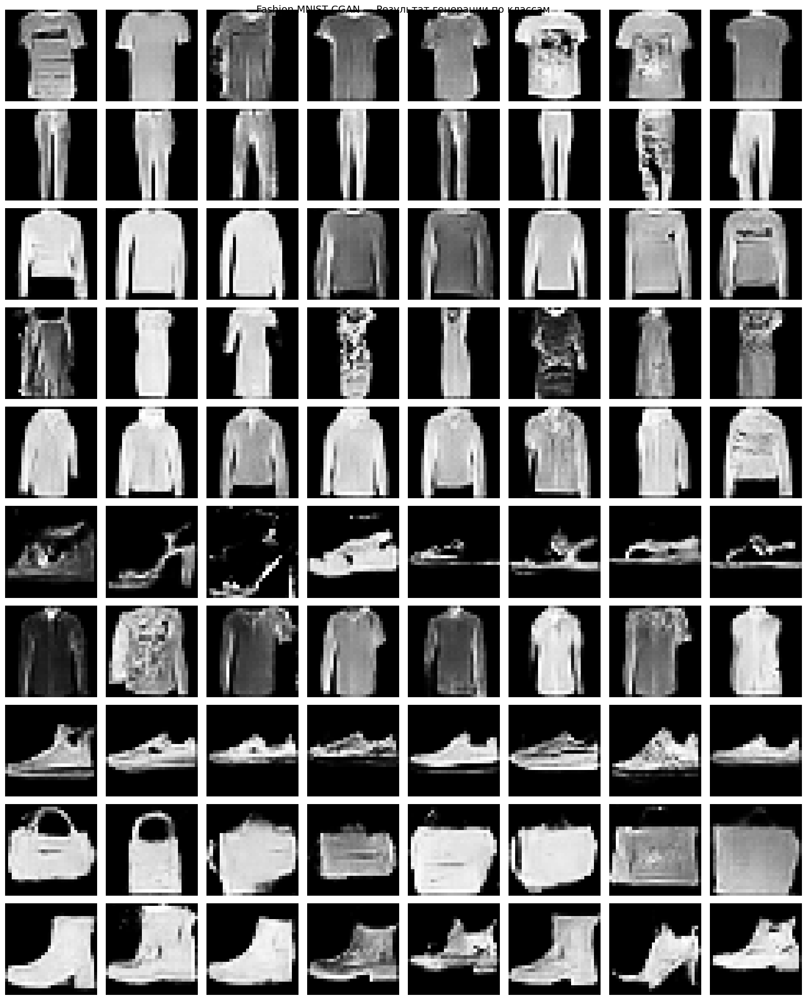

In [ ]:
# Ваш код
def demonstrate_cgan_results(generator, latent_dim=100,
                              n_classes=10, samples_per_class=8):
    """Генерирует финальную сетку: каждая строка = один класс."""
    n_samples = n_classes * samples_per_class
    latent_vectors = np.random.randn(n_samples, latent_dim)
    labels = np.array([c for c in range(n_classes)
                       for _ in range(samples_per_class)])

    imgs = generator.predict([latent_vectors, labels], verbose=0)
    imgs = 0.5 * imgs + 0.5

    fig, axes = plt.subplots(n_classes, samples_per_class,
                             figsize=(samples_per_class * 2, n_classes * 2))
    for i in range(n_classes):
        for j in range(samples_per_class):
            idx = i * samples_per_class + j
            axes[i, j].imshow(imgs[idx, :, :, 0], cmap='gray')
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_ylabel(CLASS_NAMES[i], fontsize=9,
                                      rotation=0, labelpad=55)

    plt.suptitle('Fashion MNIST CGAN — Результат генерации по классам',
                 fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{SAVE_PATH}task2_final_results.png", dpi=150)
    plt.show()

demonstrate_cgan_results(generator, LATENT_DIM, N_CLASSES, samples_per_class=8)

---

## **Задание №3.** Обучите генератор колоризировать изображения из выбранного Вами датасета (можете использовать датасет из работы №6, в которой Вы решали аналогичную задачу).

In [ ]:
import kagglehub

path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")
print("Path to dataset files:", path)

Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.
Path to dataset files: /kaggle/input/stanford-cars-dataset


In [ ]:
IMG_SHAPE = (128, 128, 3)
print(f"Форма изображения: {IMG_SHAPE}")

Форма изображения: (128, 128, 3)


In [ ]:
import os
from tensorflow.keras.utils import load_img, img_to_array

def load_cars_data(dataset_path, size=(256, 256), max_images=3000):
    """
    Загружает изображения Stanford Cars.
    Возвращает пары: (grayscale, color).
    """
    color_list = []
    gray_list = []
    count = 0

    # Рекурсивно ищем все jpg/png изображения
    for root, dirs, files in os.walk(dataset_path):
        for fname in files:
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                fpath = os.path.join(root, fname)
                try:
                    # Загружаем цветное изображение
                    img_color = load_img(fpath, target_size=size, color_mode='rgb')
                    img_color = img_to_array(img_color)

                    # Создаём чёрно-белую версию
                    img_gray = load_img(fpath, target_size=size, color_mode='grayscale')
                    img_gray = img_to_array(img_gray)
                    # Повторяем канал 3 раза: (256,256,1) -> (256,256,3)
                    img_gray = np.repeat(img_gray, 3, axis=-1)

                    color_list.append(img_color)
                    gray_list.append(img_gray)
                    count += 1

                    if count >= max_images:
                        break
                except Exception as e:
                    continue
        if count >= max_images:
            break

    X_color = np.array(color_list)
    X_gray = np.array(gray_list)

    # Нормализация: [0, 255] -> [-1, 1]
    X_color = X_color / 127.5 - 1.
    X_gray  = X_gray  / 127.5 - 1.

    print(f"Загружено изображений: {len(X_color)}")
    print(f"Форма (цветные): {X_color.shape}")
    print(f"Форма (ч/б):     {X_gray.shape}")
    print(f"Диапазон: [{X_color.min():.2f}, {X_color.max():.2f}]")

    return X_gray, X_color   # source=grayscale, target=color

X_source, X_target = load_cars_data(path, size=(128, 128), max_images=1500)

Загружено изображений: 1500
Форма (цветные): (1500, 128, 128, 3)
Форма (ч/б):     (1500, 128, 128, 3)
Диапазон: [-1.00, 1.00]


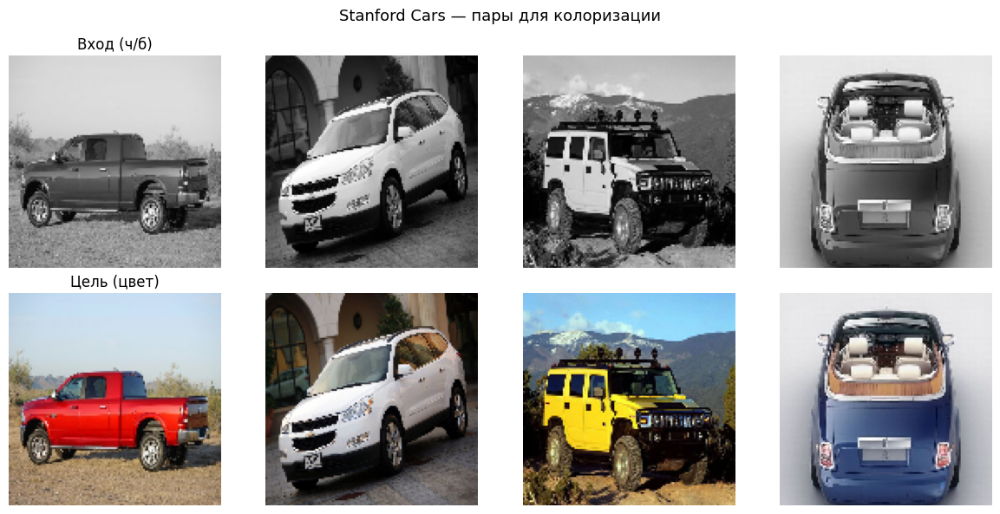

In [ ]:
def visualize_pairs(X_source, X_target, n=4):
    fig, axes = plt.subplots(2, n, figsize=(n * 3, 6))
    idx = np.random.randint(0, len(X_source), n)

    for i, id in enumerate(idx):
        gray = (X_source[id] + 1) / 2.0
        color = (X_target[id] + 1) / 2.0

        axes[0, i].imshow(gray)
        axes[0, i].set_title('Вход (ч/б)' if i == 0 else '')
        axes[0, i].axis('off')

        axes[1, i].imshow(color)
        axes[1, i].set_title('Цель (цвет)' if i == 0 else '')
        axes[1, i].axis('off')

    plt.suptitle('Stanford Cars — пары для колоризации', fontsize=13)
    plt.tight_layout()
    plt.show()

visualize_pairs(X_source, X_target)

In [ ]:
from tensorflow.keras.optimizers import Adam
def build_discriminator(image_shape=(256, 256, 3)):
    init = RandomNormal(stddev=0.02)

    in_src    = Input(shape=image_shape, name="source_image")   # ч/б
    in_target = Input(shape=image_shape, name="target_image")   # цвет

    # Конкатенируем: (256,256,3) + (256,256,3) = (256,256,6)
    merged = Concatenate()([in_src, in_target])

    # C64: 256->128
    d = Conv2D(64,  (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(0.2)(d)
    # C128: 128->64
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)
    # C256: 64->32
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)
    # C512: 32->16
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)
    # C512 stride=1
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)
    # Patch output: матрица 16x16
    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(patch_out)

    model = Model([in_src, in_target], patch_out, name="PatchGAN")
    model.compile(loss='binary_crossentropy',
                  optimizer=Adam(0.0002, beta_1=0.5),
                  loss_weights=[0.5])
    model.summary()
    return model

discriminator = build_discriminator(IMG_SHAPE)

Model: "PatchGAN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ source_image        │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 128,  │          0 │ source_image[0][… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 64, 64,    │      6,208 │ concatenate_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_10      │ (None, 64, 64,    │          0 │ conv2d_12[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 32, 32,    │    131,200 │ leaky_re_lu_10[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_13[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 16, 16,    │    524,544 │ leaky_re_lu_11[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      1,024 │ conv2d_14[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_12      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 8, 8, 512) │  2,097,664 │ leaky_re_lu_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_13      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 8, 8, 512) │  4,194,816 │ leaky_re_lu_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_14      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 6,968,257 (26.58 MB)

 Trainable params: 6,965,441 (26.57 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [ ]:
def build_generator(image_shape=(128, 128, 3)):
    init = RandomNormal(stddev=0.02)
    in_image = Input(shape=image_shape)

    # Энкодер (6 блоков для 128x128)
    e1 = encoder_block(in_image, 64,  batchnorm=False)  # 64x64
    e2 = encoder_block(e1,  128)   # 32x32
    e3 = encoder_block(e2,  256)   # 16x16
    e4 = encoder_block(e3,  512)   # 8x8
    e5 = encoder_block(e4,  512)   # 4x4
    e6 = encoder_block(e5,  512)   # 2x2

    # Bottleneck
    b = Conv2D(512, (4,4), strides=(2,2), padding='same',
               kernel_initializer=init)(e6)   # 1x1
    b = Activation('relu')(b)

    # Декодер (6 блоков со skip connections)
    d1 = decoder_block(b,  e6, 512, dropout=True)   # 2x2
    d2 = decoder_block(d1, e5, 512, dropout=True)   # 4x4
    d3 = decoder_block(d2, e4, 512, dropout=True)   # 8x8
    d4 = decoder_block(d3, e3, 256, dropout=False)  # 16x16
    d5 = decoder_block(d4, e2, 128, dropout=False)  # 32x32
    d6 = decoder_block(d5, e1, 64,  dropout=False)  # 64x64

    # Выходной слой: 64x64 -> 128x128, RGB
    out = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same',
                          kernel_initializer=init)(d6)
    out = Activation('tanh')(out)

    model = Model(in_image, out, name="UNet_Generator")
    model.summary()
    return model

generator = build_generator(IMG_SHAPE)

Model: "UNet_Generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 64, 64,    │      3,136 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_22      │ (None, 64, 64,    │          0 │ conv2d_26[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 32, 32,    │    131,200 │ leaky_re_lu_22[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_27[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_23      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 16, 16,    │    524,544 │ leaky_re_lu_23[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      1,024 │ conv2d_28[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_24      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_29 (Conv2D)  │ (None, 8, 8, 512) │  2,097,664 │ leaky_re_lu_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_29[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_25      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 4, 4, 512) │  4,194,816 │ leaky_re_lu_25[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 4, 4, 512) │      2,048 │ conv2d_30[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_26      │ (None, 4, 4, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 2, 2, 512) │  4,194,816 │ leaky_re_lu_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2, 2, 512) │      2,048 │ conv2d_31[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_27      │ (None, 2, 2, 512) │          0 │ batch_normalizat

 Total params: 41,841,283 (159.61 MB)

 Trainable params: 41,833,475 (159.58 MB)

 Non-trainable params: 7,808 (30.50 KB)

In [ ]:
def build_gan(generator, discriminator, image_shape=(256, 256, 3)):
    for layer in discriminator.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False

    in_src  = Input(shape=image_shape)
    gen_out = generator(in_src)
    dis_out = discriminator([in_src, gen_out])

    model = Model(in_src, [dis_out, gen_out], name="Colorization_GAN")
    model.compile(
        loss=['binary_crossentropy', 'mae'],
        optimizer=Adam(0.0002, beta_1=0.5),
        loss_weights=[1, 100]   # L_total = L_GAN + 100 * L_L1
    )
    model.summary()
    return model

gan_model = build_gan(generator, discriminator, IMG_SHAPE)

Model: "Colorization_GAN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ UNet_Generator      │ (None, 128, 128,  │ 41,841,283 │ input_layer_2[0]… │
│ (Functional)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ PatchGAN            │ (None, 8, 8, 1)   │  6,968,257 │ input_layer_2[0]… │
│ (Functional)        │                   │            │ UNet_Generator[0… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 48,809,540 (186.19 MB)

 Trainable params: 41,836,291 (159.59 MB)

 Non-trainable params: 6,973,249 (26.60 MB)

In [ ]:
def get_real_samples(X_source, X_target, batch_size, patch_shape):
    idx = np.random.randint(0, len(X_source), batch_size)
    X_src = X_source[idx]
    X_tgt = X_target[idx]
    y = np.ones((batch_size, patch_shape, patch_shape, 1))
    return [X_src, X_tgt], y

def get_fake_samples(generator, X_src_batch, patch_shape):
    X_fake = generator.predict(X_src_batch, verbose=0)
    y = np.zeros((len(X_src_batch), patch_shape, patch_shape, 1))
    return X_fake, y

def save_colorization_samples(generator, X_source, X_target,
                               step, n=3, save_path=''):
    idx = np.random.randint(0, len(X_source), n)
    X_src = X_source[idx]
    X_tgt = X_target[idx]
    X_fake = generator.predict(X_src, verbose=0)

    # Денормализация
    X_src_d  = (X_src  + 1) / 2.0
    X_tgt_d  = (X_tgt  + 1) / 2.0
    X_fake_d = (X_fake + 1) / 2.0

    fig, axes = plt.subplots(n, 3, figsize=(10, n * 3.5))
    for i in range(n):
        axes[i, 0].imshow(X_src_d[i])
        axes[i, 0].set_title('Вход (ч/б)' if i == 0 else '')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(X_fake_d[i])
        axes[i, 1].set_title('Генерация (цвет)' if i == 0 else '')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(X_tgt_d[i])
        axes[i, 2].set_title('Оригинал (цвет)' if i == 0 else '')
        axes[i, 2].axis('off')

    plt.suptitle(f'Колоризация — шаг {step}', fontsize=13)
    plt.tight_layout()
    filepath = f"{save_path}colorization_step_{step:05d}.png"
    plt.savefig(filepath, dpi=100)
    plt.close()
    print(f"  Сохранено: {filepath}")

In [ ]:
def train_colorization(discriminator, generator, gan_model,
                        X_source, X_target,
                        n_epochs=50, batch_size=4,
                        save_interval=200, save_path=''):

    patch_shape = discriminator.output_shape[1]
    batches_per_epoch = len(X_source) // batch_size
    total_steps = n_epochs * batches_per_epoch

    d_real_hist, d_fake_hist, g_hist = [], [], []
    step = 0

    for epoch in range(1, n_epochs + 1):
        d_real_ep, d_fake_ep, g_ep = [], [], []

        for _ in range(batches_per_epoch):

            # --- Дискриминатор ---
            [X_src, X_tgt], y_real = get_real_samples(
                X_source, X_target, batch_size, patch_shape)
            X_fake, y_fake = get_fake_samples(
                generator, X_src, patch_shape)

            d_loss_real = discriminator.train_on_batch([X_src, X_tgt],  y_real)
            d_loss_fake = discriminator.train_on_batch([X_src, X_fake], y_fake)

            # --- Генератор ---
            g_loss, _, _ = gan_model.train_on_batch(X_src, [y_real, X_tgt])

            d_real_ep.append(d_loss_real)
            d_fake_ep.append(d_loss_fake)
            g_ep.append(g_loss)
            step += 1

            if step % save_interval == 0:
                save_colorization_samples(generator, X_source, X_target,
                                          step, save_path=save_path)
                # Сохраняем веса
                generator.save(f"{save_path}task3_generator.h5")
                discriminator.save(f"{save_path}task3_discriminator.h5")
                print(f"  Веса сохранены (шаг {step})")

        # Лог эпохи
        d_r = np.mean(d_real_ep)
        d_f = np.mean(d_fake_ep)
        g   = np.mean(g_ep)
        d_real_hist.append(d_r)
        d_fake_hist.append(d_f)
        g_hist.append(g)

        print(f"Эпоха {epoch:3d}/{n_epochs} | "
              f"D_real: {d_r:.4f} | D_fake: {d_f:.4f} | G: {g:.4f}")

    return d_real_hist, d_fake_hist, g_hist

In [ ]:
# Ваш код
N_EPOCHS    = 50
BATCH_SIZE  = 4
SAVE_INTERVAL = 200

d_real_hist, d_fake_hist, g_hist = train_colorization(
    discriminator=discriminator,
    generator=generator,
    gan_model=gan_model,
    X_source=X_source,
    X_target=X_target,
    n_epochs=N_EPOCHS,
    batch_size=BATCH_SIZE,
    save_interval=SAVE_INTERVAL,
    save_path=SAVE_PATH
)

  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_00200.png


  Веса сохранены (шаг 200)
Эпоха   1/50 | D_real: 0.4094 | D_fake: 0.4100 | G: 21.1433


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_00400.png


  Веса сохранены (шаг 400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_00600.png


  Веса сохранены (шаг 600)
Эпоха   2/50 | D_real: 0.4258 | D_fake: 0.4260 | G: 14.8332


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_00800.png


  Веса сохранены (шаг 800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_01000.png


  Веса сохранены (шаг 1000)
Эпоха   3/50 | D_real: 0.4344 | D_fake: 0.4345 | G: 13.0823


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_01200.png


  Веса сохранены (шаг 1200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_01400.png


  Веса сохранены (шаг 1400)
Эпоха   4/50 | D_real: 0.4394 | D_fake: 0.4396 | G: 12.0990


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_01600.png


  Веса сохранены (шаг 1600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_01800.png


  Веса сохранены (шаг 1800)
Эпоха   5/50 | D_real: 0.4430 | D_fake: 0.4431 | G: 11.4144


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_02000.png


  Веса сохранены (шаг 2000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_02200.png


  Веса сохранены (шаг 2200)
Эпоха   6/50 | D_real: 0.4458 | D_fake: 0.4459 | G: 10.9314


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_02400.png


  Веса сохранены (шаг 2400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_02600.png


  Веса сохранены (шаг 2600)
Эпоха   7/50 | D_real: 0.4480 | D_fake: 0.4480 | G: 10.5571


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_02800.png


  Веса сохранены (шаг 2800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_03000.png


  Веса сохранены (шаг 3000)
Эпоха   8/50 | D_real: 0.4497 | D_fake: 0.4498 | G: 10.2388


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_03200.png


  Веса сохранены (шаг 3200)
Эпоха   9/50 | D_real: 0.4512 | D_fake: 0.4513 | G: 9.9849


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_03400.png


  Веса сохранены (шаг 3400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_03600.png


  Веса сохранены (шаг 3600)
Эпоха  10/50 | D_real: 0.4525 | D_fake: 0.4525 | G: 9.7434


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_03800.png


  Веса сохранены (шаг 3800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_04000.png


  Веса сохранены (шаг 4000)
Эпоха  11/50 | D_real: 0.4536 | D_fake: 0.4536 | G: 9.5371


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_04200.png


  Веса сохранены (шаг 4200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_04400.png


  Веса сохранены (шаг 4400)
Эпоха  12/50 | D_real: 0.4546 | D_fake: 0.4546 | G: 9.3666


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_04600.png


  Веса сохранены (шаг 4600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_04800.png


  Веса сохранены (шаг 4800)
Эпоха  13/50 | D_real: 0.4554 | D_fake: 0.4555 | G: 9.1989


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_05000.png


  Веса сохранены (шаг 5000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_05200.png


  Веса сохранены (шаг 5200)
Эпоха  14/50 | D_real: 0.4562 | D_fake: 0.4562 | G: 9.0404


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_05400.png


  Веса сохранены (шаг 5400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_05600.png


  Веса сохранены (шаг 5600)
Эпоха  15/50 | D_real: 0.4569 | D_fake: 0.4569 | G: 8.8898


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_05800.png


  Веса сохранены (шаг 5800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_06000.png


  Веса сохранены (шаг 6000)
Эпоха  16/50 | D_real: 0.4575 | D_fake: 0.4575 | G: 8.7457


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_06200.png


  Веса сохранены (шаг 6200)
Эпоха  17/50 | D_real: 0.4580 | D_fake: 0.4580 | G: 8.6126


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_06400.png


  Веса сохранены (шаг 6400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_06600.png


  Веса сохранены (шаг 6600)
Эпоха  18/50 | D_real: 0.4585 | D_fake: 0.4585 | G: 8.4779


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_06800.png


  Веса сохранены (шаг 6800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_07000.png


  Веса сохранены (шаг 7000)
Эпоха  19/50 | D_real: 0.4589 | D_fake: 0.4590 | G: 8.3611


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_07200.png


  Веса сохранены (шаг 7200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_07400.png


  Веса сохранены (шаг 7400)
Эпоха  20/50 | D_real: 0.4593 | D_fake: 0.4593 | G: 8.2490


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_07600.png


  Веса сохранены (шаг 7600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_07800.png


  Веса сохранены (шаг 7800)
Эпоха  21/50 | D_real: 0.4597 | D_fake: 0.4597 | G: 8.1418


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_08000.png


  Веса сохранены (шаг 8000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_08200.png


  Веса сохранены (шаг 8200)
Эпоха  22/50 | D_real: 0.4600 | D_fake: 0.4600 | G: 8.0390


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_08400.png


  Веса сохранены (шаг 8400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_08600.png


  Веса сохранены (шаг 8600)
Эпоха  23/50 | D_real: 0.4603 | D_fake: 0.4603 | G: 7.9338


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_08800.png


  Веса сохранены (шаг 8800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_09000.png


  Веса сохранены (шаг 9000)
Эпоха  24/50 | D_real: 0.4605 | D_fake: 0.4606 | G: 7.8398


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_09200.png


  Веса сохранены (шаг 9200)
Эпоха  25/50 | D_real: 0.4608 | D_fake: 0.4608 | G: 7.7488


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_09400.png


  Веса сохранены (шаг 9400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_09600.png


  Веса сохранены (шаг 9600)
Эпоха  26/50 | D_real: 0.4610 | D_fake: 0.4610 | G: 7.6615


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_09800.png


  Веса сохранены (шаг 9800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_10000.png


  Веса сохранены (шаг 10000)
Эпоха  27/50 | D_real: 0.4612 | D_fake: 0.4612 | G: 7.5762


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_10200.png


  Веса сохранены (шаг 10200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_10400.png


  Веса сохранены (шаг 10400)
Эпоха  28/50 | D_real: 0.4613 | D_fake: 0.4613 | G: 7.4934


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_10600.png


  Веса сохранены (шаг 10600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_10800.png


  Веса сохранены (шаг 10800)
Эпоха  29/50 | D_real: 0.4615 | D_fake: 0.4615 | G: 7.4133


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_11000.png


  Веса сохранены (шаг 11000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_11200.png


  Веса сохранены (шаг 11200)
Эпоха  30/50 | D_real: 0.4616 | D_fake: 0.4616 | G: 7.3393


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_11400.png


  Веса сохранены (шаг 11400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_11600.png


  Веса сохранены (шаг 11600)
Эпоха  31/50 | D_real: 0.4617 | D_fake: 0.4617 | G: 7.2663


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_11800.png


  Веса сохранены (шаг 11800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_12000.png


  Веса сохранены (шаг 12000)
Эпоха  32/50 | D_real: 0.4618 | D_fake: 0.4618 | G: 7.1954


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_12200.png


  Веса сохранены (шаг 12200)
Эпоха  33/50 | D_real: 0.4619 | D_fake: 0.4619 | G: 7.1273


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_12400.png


  Веса сохранены (шаг 12400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_12600.png


  Веса сохранены (шаг 12600)
Эпоха  34/50 | D_real: 0.4619 | D_fake: 0.4619 | G: 7.0601


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_12800.png


  Веса сохранены (шаг 12800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_13000.png


  Веса сохранены (шаг 13000)
Эпоха  35/50 | D_real: 0.4620 | D_fake: 0.4620 | G: 6.9960


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_13200.png


  Веса сохранены (шаг 13200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_13400.png


  Веса сохранены (шаг 13400)
Эпоха  36/50 | D_real: 0.4620 | D_fake: 0.4621 | G: 6.9326


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_13600.png


  Веса сохранены (шаг 13600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_13800.png


  Веса сохранены (шаг 13800)
Эпоха  37/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.8714


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_14000.png


  Веса сохранены (шаг 14000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_14200.png


  Веса сохранены (шаг 14200)
Эпоха  38/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.8118


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_14400.png


  Веса сохранены (шаг 14400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_14600.png


  Веса сохранены (шаг 14600)
Эпоха  39/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.7539


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_14800.png


  Веса сохранены (шаг 14800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_15000.png


  Веса сохранены (шаг 15000)
Эпоха  40/50 | D_real: 0.4621 | D_fake: 0.4622 | G: 6.7004


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_15200.png


  Веса сохранены (шаг 15200)
Эпоха  41/50 | D_real: 0.4622 | D_fake: 0.4622 | G: 6.6470


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_15400.png


  Веса сохранены (шаг 15400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_15600.png


  Веса сохранены (шаг 15600)
Эпоха  42/50 | D_real: 0.4622 | D_fake: 0.4622 | G: 6.5926


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_15800.png


  Веса сохранены (шаг 15800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_16000.png


  Веса сохранены (шаг 16000)
Эпоха  43/50 | D_real: 0.4621 | D_fake: 0.4622 | G: 6.5395


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_16200.png


  Веса сохранены (шаг 16200)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_16400.png


  Веса сохранены (шаг 16400)
Эпоха  44/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.4908


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_16600.png


  Веса сохранены (шаг 16600)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_16800.png


  Веса сохранены (шаг 16800)
Эпоха  45/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.4424


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_17000.png


  Веса сохранены (шаг 17000)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_17200.png


  Веса сохранены (шаг 17200)
Эпоха  46/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.3939


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_17400.png


  Веса сохранены (шаг 17400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_17600.png


  Веса сохранены (шаг 17600)
Эпоха  47/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.3474


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_17800.png


  Веса сохранены (шаг 17800)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_18000.png


  Веса сохранены (шаг 18000)
Эпоха  48/50 | D_real: 0.4621 | D_fake: 0.4621 | G: 6.3011


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_18200.png


  Веса сохранены (шаг 18200)
Эпоха  49/50 | D_real: 0.4620 | D_fake: 0.4621 | G: 6.2571


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_18400.png


  Веса сохранены (шаг 18400)


  Сохранено: /content/drive/MyDrive/GAN_практика_8/colorization_step_18600.png


  Веса сохранены (шаг 18600)
Эпоха  50/50 | D_real: 0.4620 | D_fake: 0.4620 | G: 6.2129


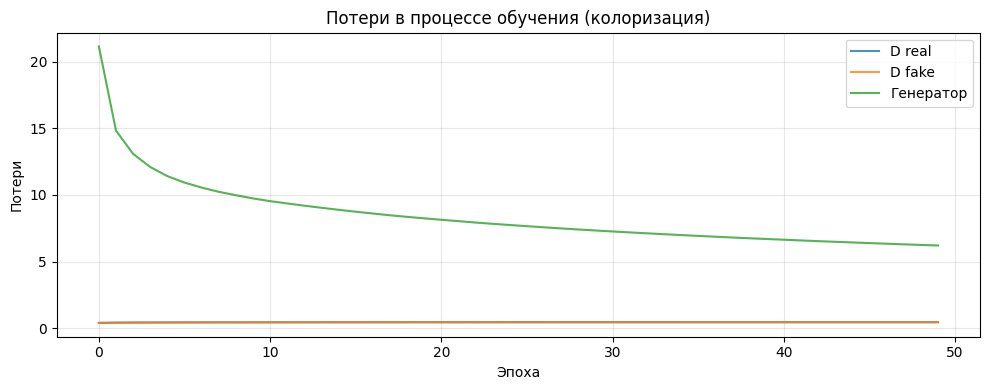

In [ ]:
def plot_colorization_history(d_real_hist, d_fake_hist, g_hist):
    plt.figure(figsize=(10, 4))
    plt.plot(d_real_hist, label='D real', alpha=0.8)
    plt.plot(d_fake_hist, label='D fake', alpha=0.8)
    plt.plot(g_hist,      label='Генератор', alpha=0.8)
    plt.xlabel('Эпоха')
    plt.ylabel('Потери')
    plt.title('Потери в процессе обучения (колоризация)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(f"{SAVE_PATH}task3_training_history.png", dpi=150)
    plt.show()

plot_colorization_history(d_real_hist, d_fake_hist, g_hist)

### **Демонстрация сгенерированных изображений:**

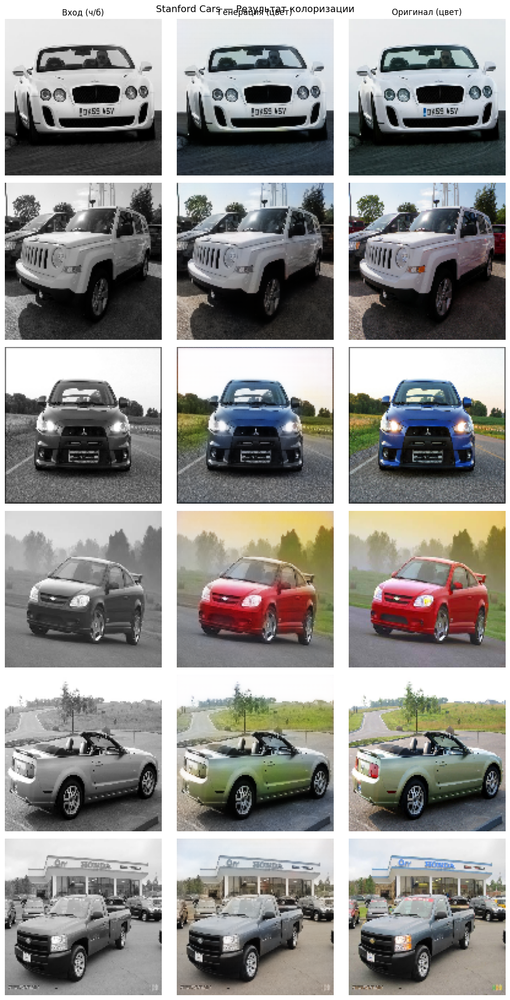

In [ ]:
# Ваш код
def demonstrate_colorization(generator, X_source, X_target,
                              n=6, save_path=''):
    idx = np.random.randint(0, len(X_source), n)
    X_src  = X_source[idx]
    X_tgt  = X_target[idx]
    X_fake = generator.predict(X_src, verbose=0)

    X_src_d  = (X_src  + 1) / 2.0
    X_tgt_d  = (X_tgt  + 1) / 2.0
    X_fake_d = (X_fake + 1) / 2.0

    fig, axes = plt.subplots(n, 3, figsize=(11, n * 3.5))
    for i in range(n):
        axes[i, 0].imshow(X_src_d[i])
        axes[i, 0].set_title('Вход (ч/б)' if i == 0 else '')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(X_fake_d[i])
        axes[i, 1].set_title('Генерация (цвет)' if i == 0 else '')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(X_tgt_d[i])
        axes[i, 2].set_title('Оригинал (цвет)' if i == 0 else '')
        axes[i, 2].axis('off')

    plt.suptitle('Stanford Cars — Результат колоризации', fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{save_path}task3_final_results.png", dpi=150)
    plt.show()

demonstrate_colorization(generator, X_source, X_target,
                         n=6, save_path=SAVE_PATH)

---

## **Задание №4.** Обучите генератор воспроизводить изображения из выбранного Вами датасета (pix2pix).



---
Примеры таких датасетов представлены на сайтах [kaggle.com](https://www.kaggle.com/search?q=pix2pix+in%3Adatasets+datasetFileTypes%3Ajpg+datasetFileTypes%3Apng) и [efrosgans.eecs.berkeley.edu*](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/).

**\*Калифорнийский университет Беркли (UC Berkeley) внесён в реестр организаций, деятельность которых признана нежелательной в России.**


---

In [ ]:
import kagglehub

path = kagglehub.dataset_download("balraj98/cityscapes-pix2pix-dataset")
print("Path to dataset files:", path)

Using Colab cache for faster access to the 'cityscapes-pix2pix-dataset' dataset.
Path to dataset files: /kaggle/input/cityscapes-pix2pix-dataset


In [ ]:
IMG_SHAPE = (256, 256, 3)

print(f"Форма изображения: {IMG_SHAPE}")

Форма изображения: (256, 256, 3)


In [ ]:
from tensorflow.keras.utils import load_img, img_to_array

def load_cityscapes_data(dataset_path, size=(256, 256), max_images=500):
    source_list = []
    target_list = []
    count = 0
    train_path = os.path.join(dataset_path, 'train')
    for fname in sorted(os.listdir(train_path)):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            fpath = os.path.join(train_path, fname)
            try:
                img = load_img(fpath, target_size=(256, 512))
                pixels = img_to_array(img)
                target_img = pixels[:, :256, :]
                source_img = pixels[:, 256:, :]
                source_list.append(source_img)
                target_list.append(target_img)
                count += 1
                if count >= max_images:
                    break
            except Exception as e:
                continue
    X_source = np.array(source_list) / 127.5 - 1.
    X_target = np.array(target_list) / 127.5 - 1.
    return X_source, X_target

X_source, X_target = load_cityscapes_data(path, max_images=500)
print(X_source.shape, X_target.shape)

(500, 256, 256, 3) (500, 256, 256, 3)


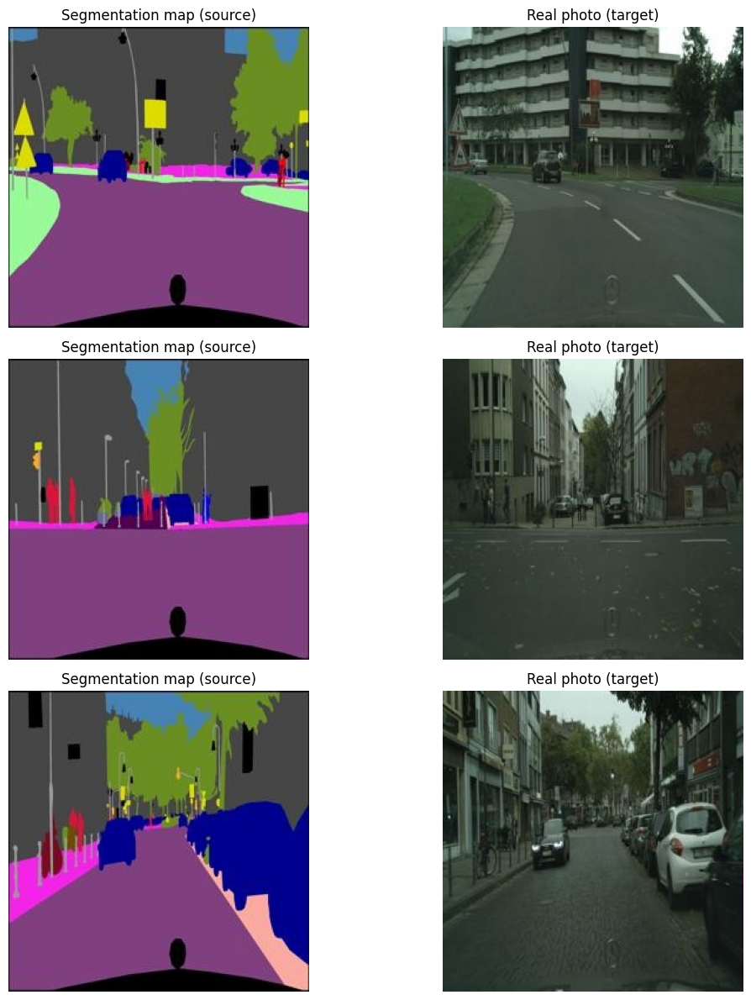

In [ ]:
def visualize_pairs(X_source, X_target, n=3):
    plt.figure(figsize=(12, 4*n))
    for i in range(n):
        ax = plt.subplot(n, 2, 2*i+1)
        plt.imshow((X_source[i] + 1) / 2.0)
        plt.title("Segmentation map (source)")
        plt.axis('off')
        ax = plt.subplot(n, 2, 2*i+2)
        plt.imshow((X_target[i] + 1) / 2.0)
        plt.title("Real photo (target)")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_pairs(X_source, X_target, n=3)

In [ ]:
IMG_SHAPE = (256, 256, 3)

def define_discriminator(image_shape=IMG_SHAPE):
    init = RandomNormal(stddev=0.02)
    in_src = Input(shape=image_shape)
    in_tgt = Input(shape=image_shape)
    merged = Concatenate()([in_src, in_tgt])

    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(0.2)(d)

    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)

    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)

    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)

    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(0.2)(d)

    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)

    model = Model([in_src, in_tgt], patch_out)
    model.compile(loss='binary_crossentropy',
                  optimizer=Adam(learning_rate=0.0002, beta_1=0.5),
                  loss_weights=[0.5])
    return model

d_model = define_discriminator()
d_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 input_6 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 concatenate_8 (Concatenate  (None, 256, 256, 6)          0         ['input_5[0][0]',             
 )                                                                   'input_6[0][0]']             
                                                                                                  
 conv2d_14 (Conv2D)          (None, 128, 128, 64)         6208      ['concatenate_8[0][0]'] 

In [ ]:
def encoder_block(layer_in, n_filters, batchnorm=True):
    init = RandomNormal(stddev=0.02)
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    g = LeakyReLU(0.2)(g)
    return g

def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    init = RandomNormal(stddev=0.02)
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    g = BatchNormalization()(g, training=True)
    if dropout:
        g = Dropout(0.5)(g, training=True)
    g = Concatenate()([g, skip_in])
    g = Activation('relu')(g)
    return g

def define_generator(image_shape=IMG_SHAPE):
    init = RandomNormal(stddev=0.02)
    in_image = Input(shape=image_shape)

    e1 = encoder_block(in_image, 64, batchnorm=False)
    e2 = encoder_block(e1, 128)
    e3 = encoder_block(e2, 256)
    e4 = encoder_block(e3, 512)
    e5 = encoder_block(e4, 512)
    e6 = encoder_block(e5, 512)
    e7 = encoder_block(e6, 512)

    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)

    d1 = decoder_block(b,  e7, 512, dropout=True)
    d2 = decoder_block(d1, e6, 512, dropout=True)
    d3 = decoder_block(d2, e5, 512, dropout=True)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64,  dropout=False)

    g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)

    model = Model(in_image, out_image)
    return model

g_model = define_generator()
g_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_20 (Conv2D)          (None, 128, 128, 64)         3136      ['input_7[0][0]']             
                                                                                                  
 leaky_re_lu_17 (LeakyReLU)  (None, 128, 128, 64)         0         ['conv2d_20[0][0]']           
                                                                                                  
 conv2d_21 (Conv2D)          (None, 64, 64, 128)          131200    ['leaky_re_lu_17[0][0]']      
                                                                                            

In [ ]:
def define_gan(g_model, d_model, image_shape=IMG_SHAPE):
    d_model.trainable = False
    in_src = Input(shape=image_shape)
    gen_out = g_model(in_src)
    dis_out = d_model([in_src, gen_out])
    model = Model(in_src, [dis_out, gen_out])
    model.compile(
        loss=['binary_crossentropy', 'mae'],
        optimizer=Adam(learning_rate=0.0002, beta_1=0.5),
        loss_weights=[1, 100]
    )
    return model

gan_model = define_gan(g_model, d_model)
gan_model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 model_4 (Functional)        (None, 256, 256, 3)          5442931   ['input_8[0][0]']             
                                                          5                                       
                                                                                                  
 model_3 (Functional)        (None, 16, 16, 1)            6968257   ['input_8[0][0]',             
                                                                     'model_4[0][0]']             
                                                                                            

In [ ]:
def generate_real_samples(dataset, n_samples, patch_shape):
    X_src, X_tgt = dataset
    ix = randint(0, X_src.shape[0], n_samples)
    X1, X2 = X_src[ix], X_tgt[ix]
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

def generate_fake_samples(g_model, samples, patch_shape):
    X = g_model.predict(samples, verbose=0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

def summarize_performance(step, g_model, dataset, save_path, n_samples=3):
    [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)

    X_realA = (X_realA + 1) / 2.0
    X_realB = (X_realB + 1) / 2.0
    X_fakeB = (X_fakeB + 1) / 2.0

    plt.figure(figsize=(12, 4))
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_realA[i])
        if i == 0: plt.title('Source (seg)')

        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_fakeB[i])
        if i == 0: plt.title('Generated')

        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.imshow(X_realB[i])
        if i == 0: plt.title('Real photo')

    fname = os.path.join(save_path, f'plot_{step+1:06d}.png')
    plt.savefig(fname)
    plt.show()
    plt.close()
    print(f'Saved: {fname}')

In [ ]:
def train(d_model, g_model, gan_model, dataset, save_path, n_epochs=30, n_batch=1):
    n_patch = d_model.output_shape[1]
    X_src, X_tgt = dataset
    bat_per_epo = int(len(X_src) / n_batch)
    n_steps = bat_per_epo * n_epochs

    d1_hist, d2_hist, g_hist = [], [], []

    for i in range(n_steps):
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)

        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])

        d1_hist.append(d_loss1)
        d2_hist.append(d_loss2)
        g_hist.append(g_loss)

        if (i+1) % bat_per_epo == 0:
            epoch_num = (i+1) // bat_per_epo
            print(f'Эпоха {epoch_num}/{n_epochs} | d_real={d_loss1:.3f} d_fake={d_loss2:.3f} g={g_loss:.3f}')
            summarize_performance(i, g_model, dataset, save_path)

    return d1_hist, d2_hist, g_hist

Эпоха 1/30 | d_real=0.490 d_fake=1.657 g=13.347


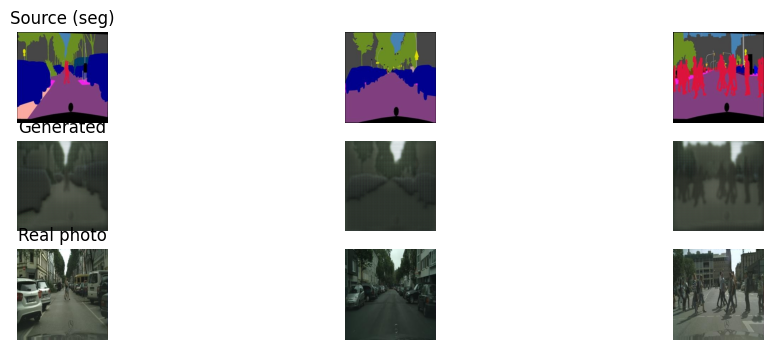

Saved: /content/drive/MyDrive/GAN_практика_8/plot_000500.png
Эпоха 2/30 | d_real=0.001 d_fake=0.000 g=17.377


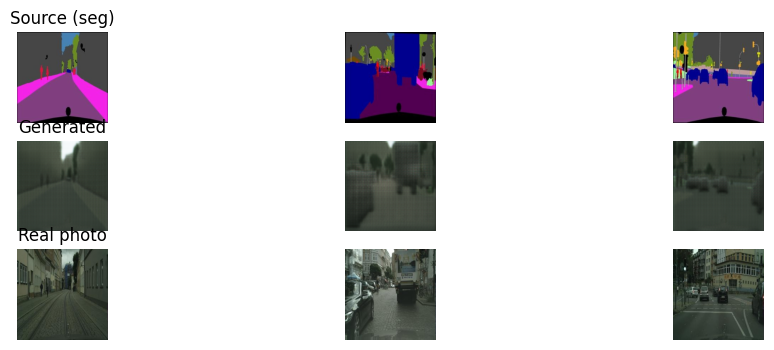

Saved: /content/drive/MyDrive/GAN_практика_8/plot_001000.png
Эпоха 3/30 | d_real=0.000 d_fake=0.001 g=21.668


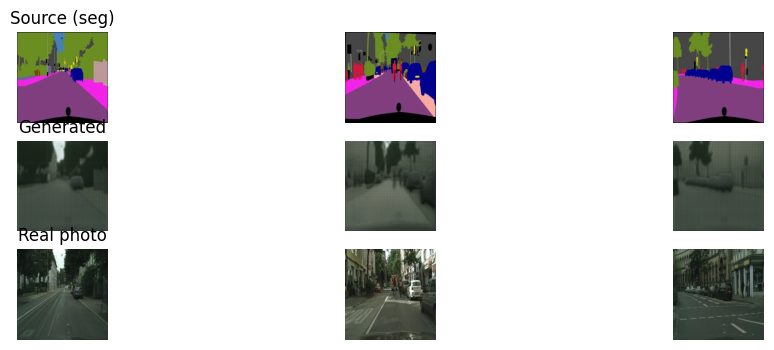

Saved: /content/drive/MyDrive/GAN_практика_8/plot_001500.png
Эпоха 4/30 | d_real=0.000 d_fake=0.000 g=20.788


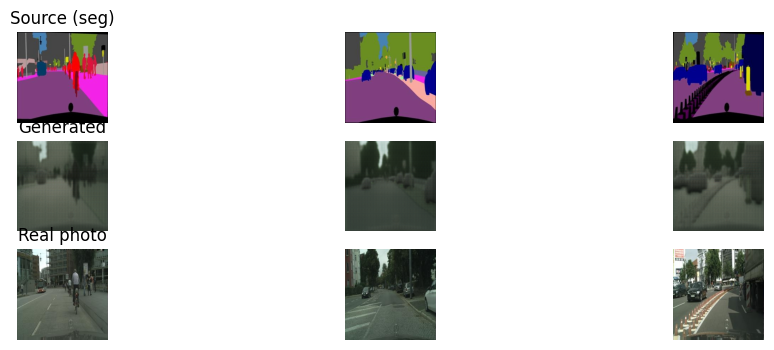

Saved: /content/drive/MyDrive/GAN_практика_8/plot_002000.png
Эпоха 5/30 | d_real=0.000 d_fake=0.000 g=12.201


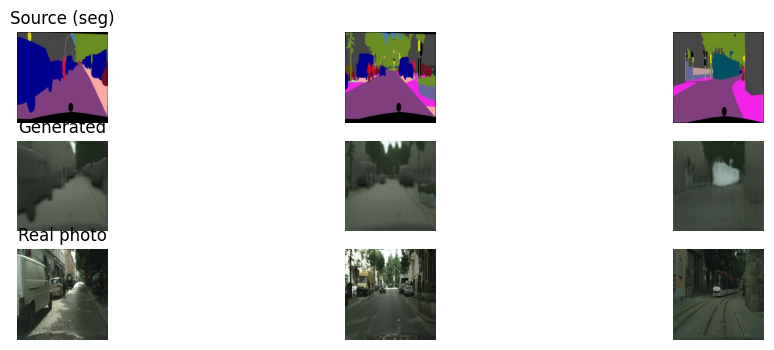

Saved: /content/drive/MyDrive/GAN_практика_8/plot_002500.png
Эпоха 6/30 | d_real=0.000 d_fake=0.000 g=15.174


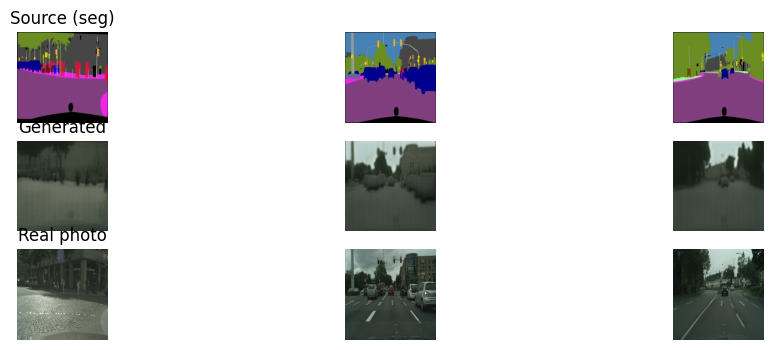

Saved: /content/drive/MyDrive/GAN_практика_8/plot_003000.png
Эпоха 7/30 | d_real=0.004 d_fake=0.017 g=13.335


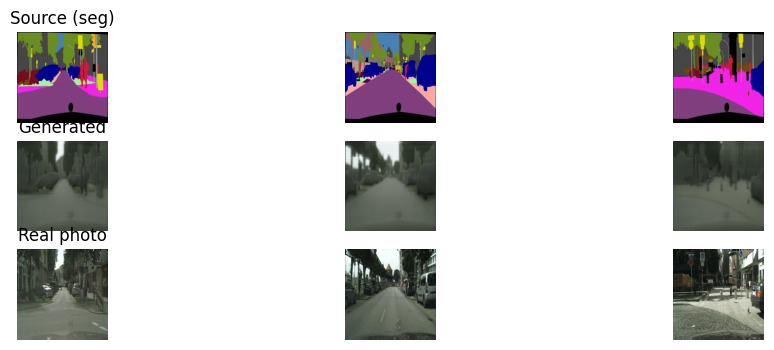

Saved: /content/drive/MyDrive/GAN_практика_8/plot_003500.png
Эпоха 8/30 | d_real=0.003 d_fake=0.001 g=16.601


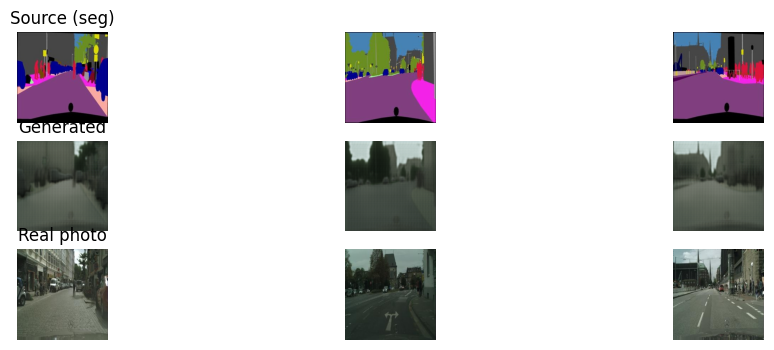

Saved: /content/drive/MyDrive/GAN_практика_8/plot_004000.png
Эпоха 9/30 | d_real=0.000 d_fake=0.000 g=20.695


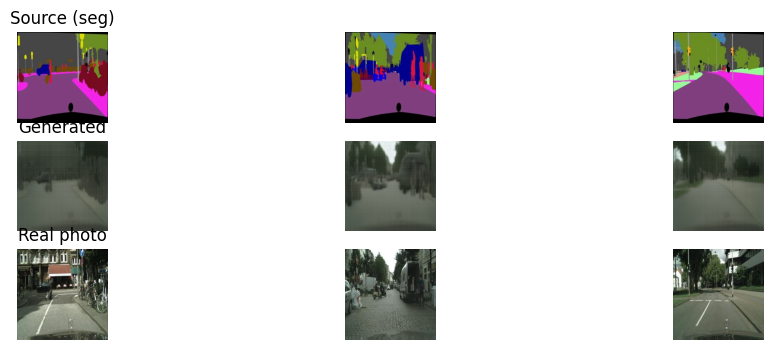

Saved: /content/drive/MyDrive/GAN_практика_8/plot_004500.png
Эпоха 10/30 | d_real=0.000 d_fake=0.000 g=10.848


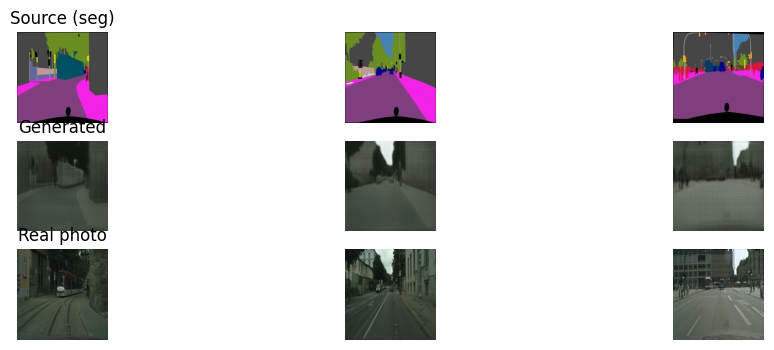

Saved: /content/drive/MyDrive/GAN_практика_8/plot_005000.png
Эпоха 11/30 | d_real=0.000 d_fake=0.000 g=12.321


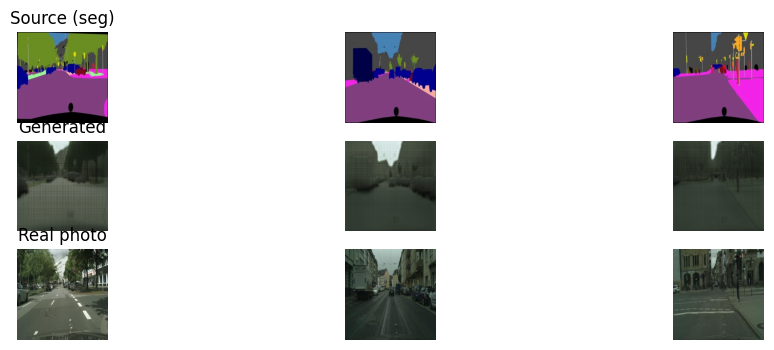

Saved: /content/drive/MyDrive/GAN_практика_8/plot_005500.png
Эпоха 12/30 | d_real=0.000 d_fake=0.000 g=10.903


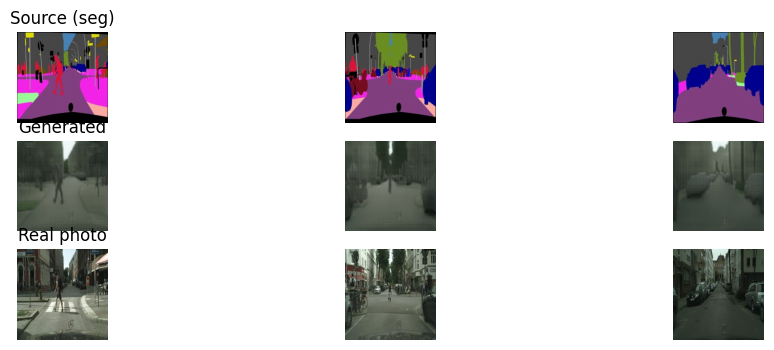

Saved: /content/drive/MyDrive/GAN_практика_8/plot_006000.png
Эпоха 13/30 | d_real=0.000 d_fake=0.000 g=11.991


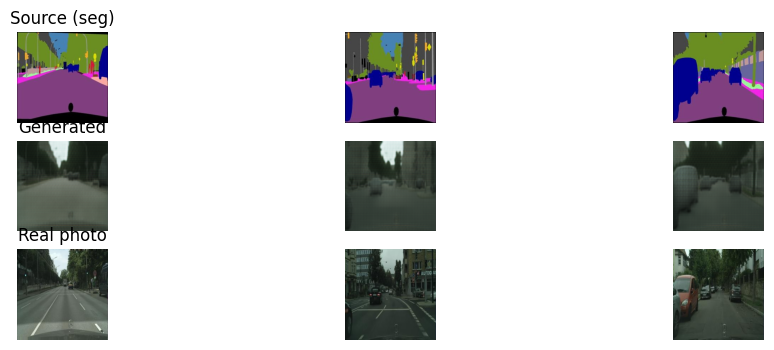

Saved: /content/drive/MyDrive/GAN_практика_8/plot_006500.png
Эпоха 14/30 | d_real=0.000 d_fake=0.000 g=10.434


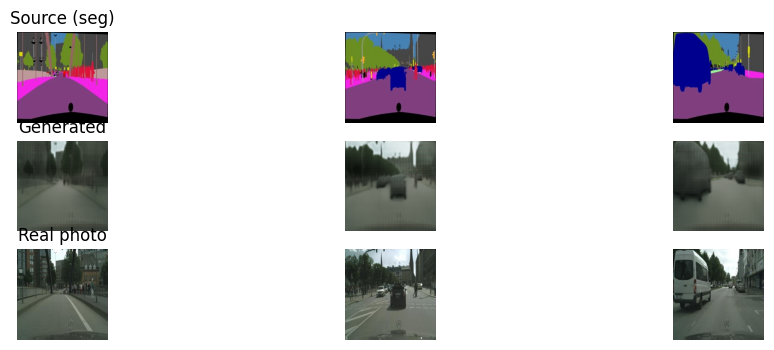

Saved: /content/drive/MyDrive/GAN_практика_8/plot_007000.png
Эпоха 15/30 | d_real=0.000 d_fake=0.000 g=11.581


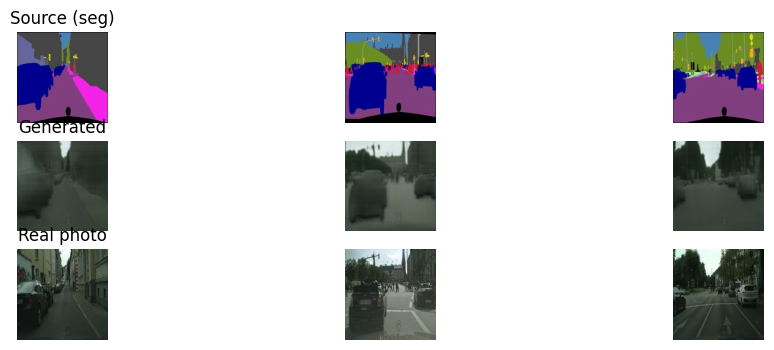

Saved: /content/drive/MyDrive/GAN_практика_8/plot_007500.png
Эпоха 16/30 | d_real=0.000 d_fake=0.000 g=10.909


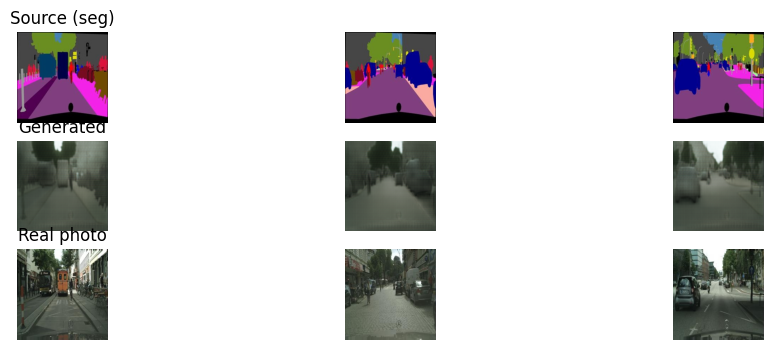

Saved: /content/drive/MyDrive/GAN_практика_8/plot_008000.png
Эпоха 17/30 | d_real=0.000 d_fake=0.000 g=16.586


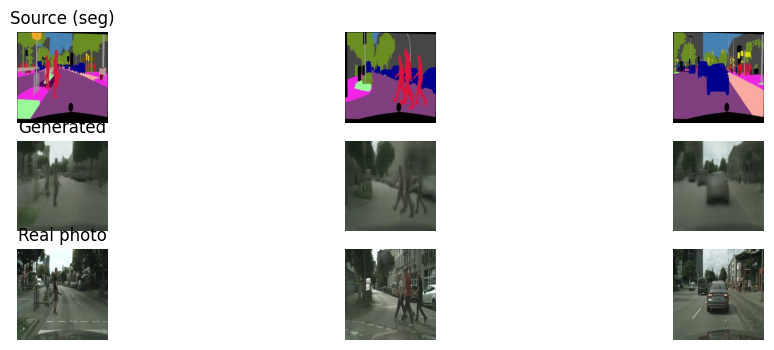

Saved: /content/drive/MyDrive/GAN_практика_8/plot_008500.png
Эпоха 18/30 | d_real=0.000 d_fake=0.000 g=13.585


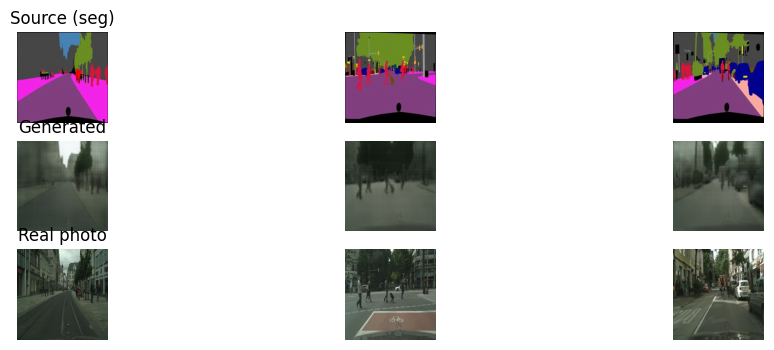

Saved: /content/drive/MyDrive/GAN_практика_8/plot_009000.png
Эпоха 19/30 | d_real=0.000 d_fake=0.000 g=7.922


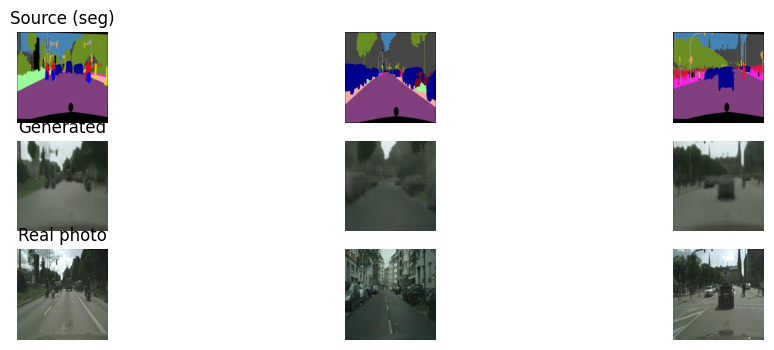

Saved: /content/drive/MyDrive/GAN_практика_8/plot_009500.png
Эпоха 20/30 | d_real=0.000 d_fake=0.000 g=7.833


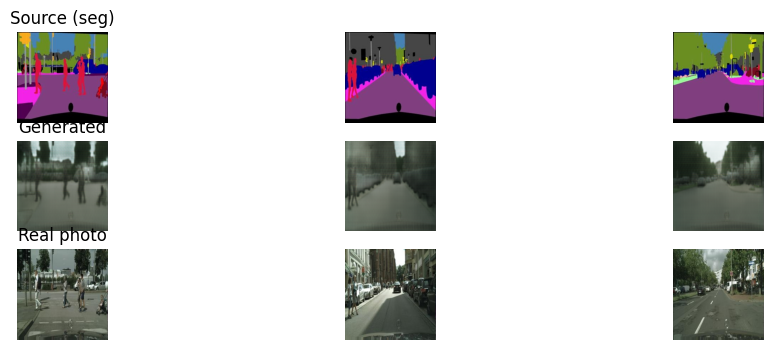

Saved: /content/drive/MyDrive/GAN_практика_8/plot_010000.png
Эпоха 21/30 | d_real=0.000 d_fake=0.000 g=12.317


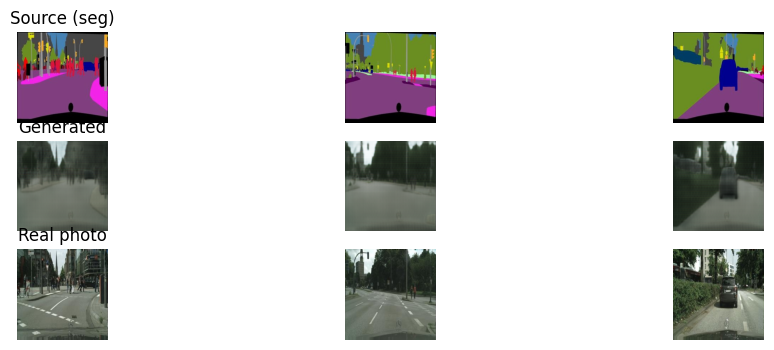

Saved: /content/drive/MyDrive/GAN_практика_8/plot_010500.png
Эпоха 22/30 | d_real=0.000 d_fake=0.000 g=16.838


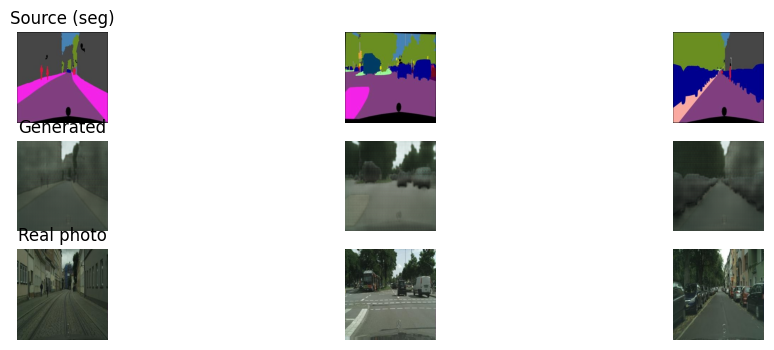

Saved: /content/drive/MyDrive/GAN_практика_8/plot_011000.png
Эпоха 23/30 | d_real=0.000 d_fake=0.000 g=16.375


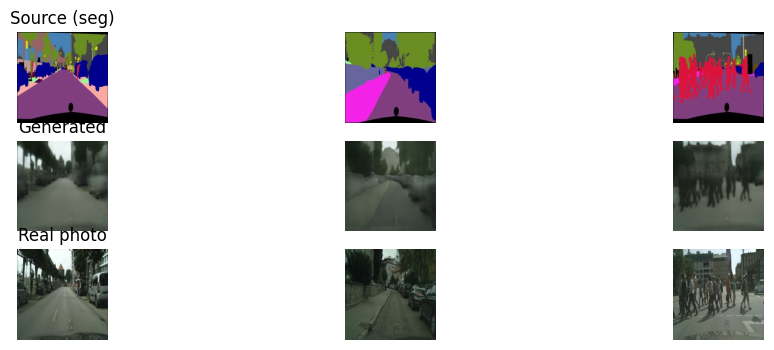

Saved: /content/drive/MyDrive/GAN_практика_8/plot_011500.png
Эпоха 24/30 | d_real=0.000 d_fake=0.000 g=13.131


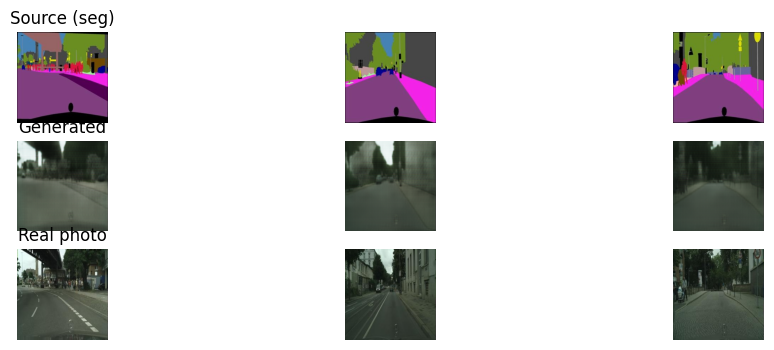

Saved: /content/drive/MyDrive/GAN_практика_8/plot_012000.png
Эпоха 25/30 | d_real=0.000 d_fake=0.000 g=13.543


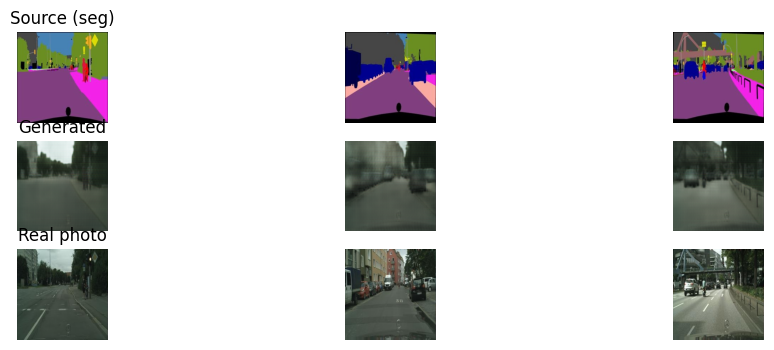

Saved: /content/drive/MyDrive/GAN_практика_8/plot_012500.png
Эпоха 26/30 | d_real=0.000 d_fake=0.000 g=8.836


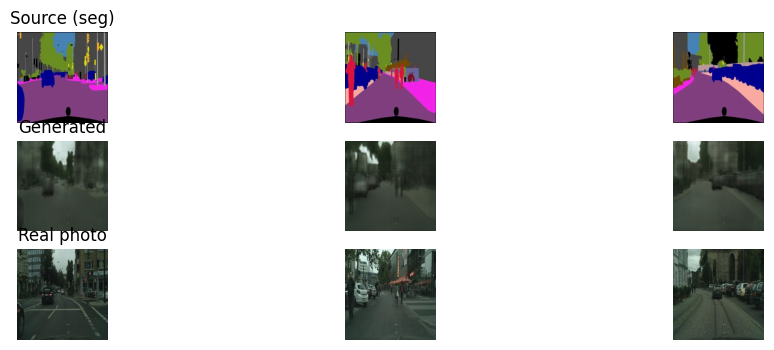

Saved: /content/drive/MyDrive/GAN_практика_8/plot_013000.png
Эпоха 27/30 | d_real=0.000 d_fake=0.000 g=11.564


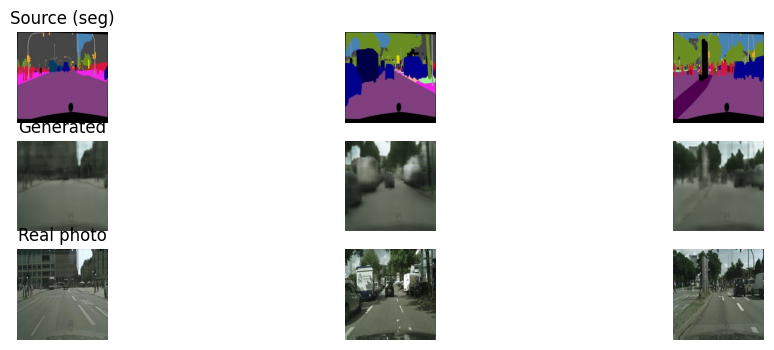

Saved: /content/drive/MyDrive/GAN_практика_8/plot_013500.png
Эпоха 28/30 | d_real=0.000 d_fake=0.000 g=10.657


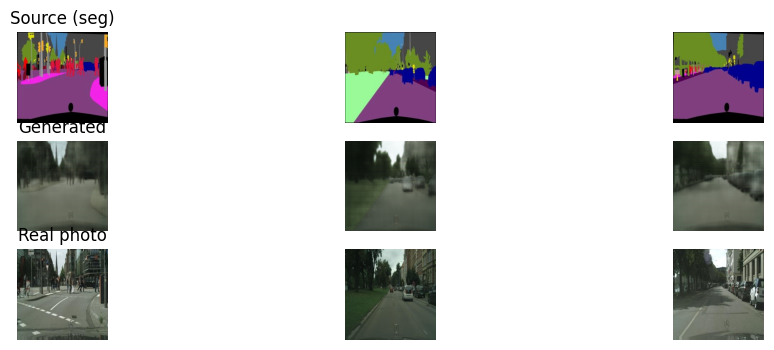

Saved: /content/drive/MyDrive/GAN_практика_8/plot_014000.png
Эпоха 29/30 | d_real=0.000 d_fake=0.000 g=12.657


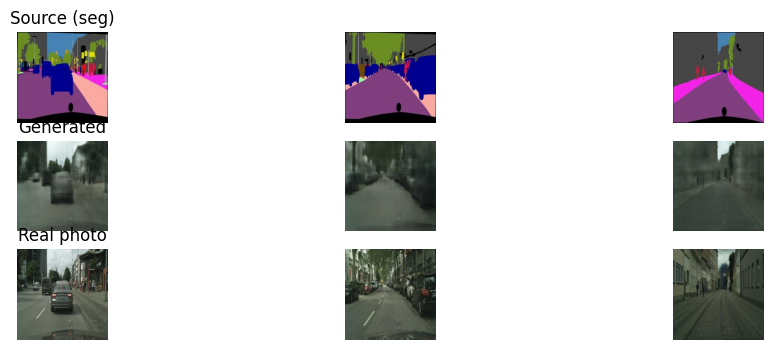

Saved: /content/drive/MyDrive/GAN_практика_8/plot_014500.png
Эпоха 30/30 | d_real=0.000 d_fake=0.000 g=8.847


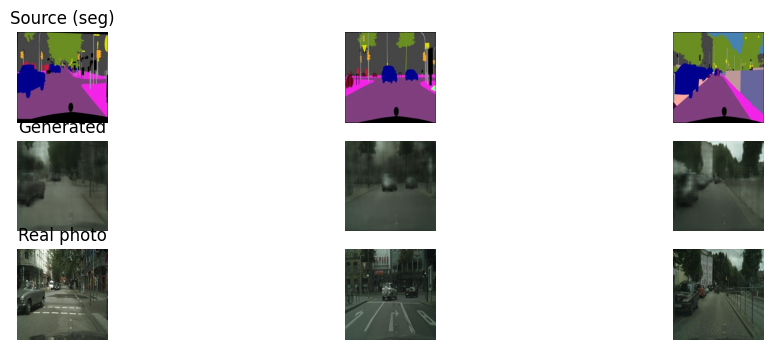

/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved: /content/drive/MyDrive/GAN_практика_8/plot_015000.png
Модели сохранены!


In [ ]:
dataset = [X_source, X_target]
d1_hist, d2_hist, g_hist = train(d_model, g_model, gan_model, dataset, SAVE_PATH, n_epochs=30, n_batch=1)

g_model.save(os.path.join(SAVE_PATH, 'pix2pix_generator.h5'))
d_model.save(os.path.join(SAVE_PATH, 'pix2pix_discriminator.h5'))
print("Модели сохранены!")

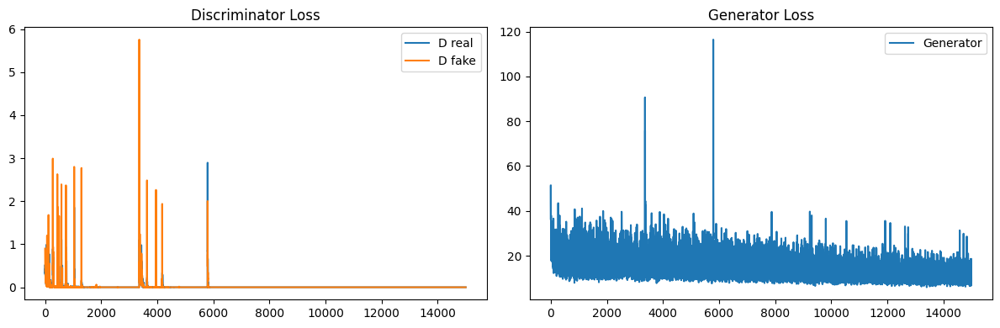

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(d1_hist, label='D real')
plt.plot(d2_hist, label='D fake')
plt.title('Discriminator Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(g_hist, label='Generator')
plt.title('Generator Loss')
plt.legend()
plt.tight_layout()
plt.show()

### **Демонстрация сгенерированных изображений:**

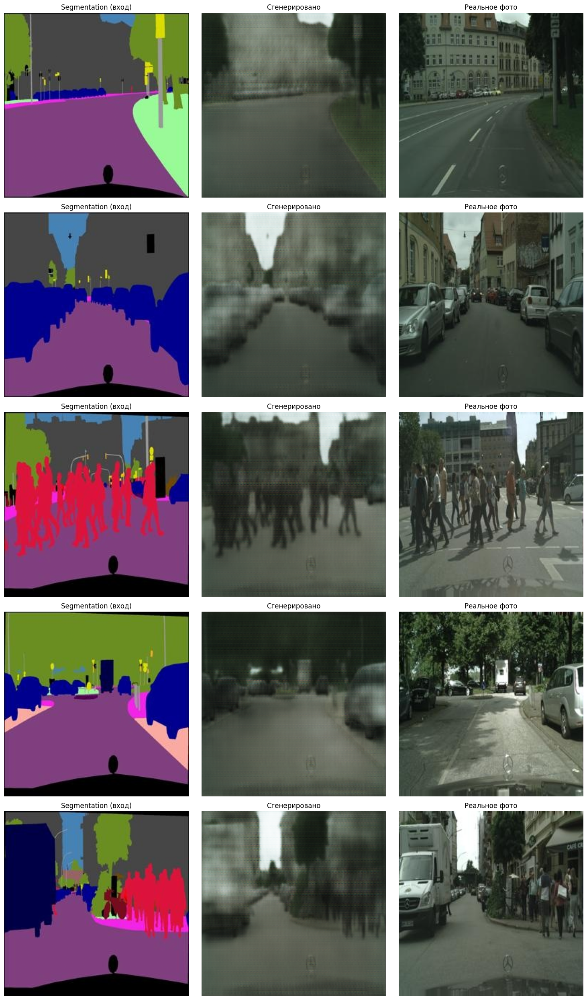

In [ ]:
# Ваш код
def demonstrate_results(g_model, dataset, n=5):
    X_src, X_tgt = dataset
    ix = randint(0, X_src.shape[0], n)
    X_realA = X_src[ix]
    X_realB = X_tgt[ix]
    X_fakeB = g_model.predict(X_realA, verbose=0)

    plt.figure(figsize=(15, 5*n))
    for i in range(n):
        plt.subplot(n, 3, 3*i+1)
        plt.imshow((X_realA[i]+1)/2.0)
        plt.title('Segmentation (вход)')
        plt.axis('off')

        plt.subplot(n, 3, 3*i+2)
        plt.imshow((X_fakeB[i]+1)/2.0)
        plt.title('Сгенерировано')
        plt.axis('off')

        plt.subplot(n, 3, 3*i+3)
        plt.imshow((X_realB[i]+1)/2.0)
        plt.title('Реальное фото')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

demonstrate_results(g_model, dataset, n=5)